Nabanita Roy

[Predicting Hazardous Seismic Bumps Part I : EDA, Feature Engineering & Train Test Split for Unbalanced Datase](https://towardsdatascience.com/predicting-hazardous-seismic-bumps-using-supervised-classification-algorithms-part-i-2c5d21f379bc)

[Predicting Hazardous Seismic Bumps Part II: Training & Tuning Supervised ML Classifiers and Model Performance Analysis](https://towardsdatascience.com/predicting-hazardous-seismic-bumps-part-ii-training-supervised-classifier-models-and-8b9104b611b0) 


## Imports

In [ ]:
import numpy as np
import pandas as pd

import scipy
from scipy.io import arff
from scipy import stats
import joblib

# scipy.optimize

In [ ]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

import time

In [ ]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV, train_test_split, StratifiedKFold, cross_validate, StratifiedShuffleSplit
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
from sklearn.svm import SVC

In [ ]:
from collections import Counter
from imblearn.over_sampling import SMOTE # doctest: +NORMALIZE_WHITESPACE


In [ ]:

from xgboost import XGBClassifier


# Mount Google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Load Data

In [ ]:
!wget https://archive.ics.uci.edu/ml/machine-learning-databases/00266/seismic-bumps.arff

--2020-09-23 20:06:13--  https://archive.ics.uci.edu/ml/machine-learning-databases/00266/seismic-bumps.arff
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 141669 (138K) [application/x-httpd-php]
Saving to: ‘seismic-bumps.arff.2’

seismic-bumps.arff. 100%[===================>] 138.35K   711KB/s    in 0.2s    

2020-09-23 20:06:13 (711 KB/s) - ‘seismic-bumps.arff.2’ saved [141669/141669]



In [ ]:
data = arff.loadarff('seismic-bumps.arff')

In [ ]:
df = pd.DataFrame(data[0])

In [ ]:
df.shape

(2584, 19)

In [ ]:
df.head()

,seismic,seismoacoustic,shift,genergy,gpuls,gdenergy,gdpuls,ghazard,nbumps,nbumps2,nbumps3,nbumps4,nbumps5,nbumps6,nbumps7,nbumps89,energy,maxenergy,class
0,b'a',b'a',b'N',15180.0,48.0,-72.0,-72.0,b'a',0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,b'0'
1,b'a',b'a',b'N',14720.0,33.0,-70.0,-79.0,b'a',1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2000.0,2000.0,b'0'
2,b'a',b'a',b'N',8050.0,30.0,-81.0,-78.0,b'a',0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,b'0'
3,b'a',b'a',b'N',28820.0,171.0,-23.0,40.0,b'a',1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3000.0,3000.0,b'0'
4,b'a',b'a',b'N',12640.0,57.0,-63.0,-52.0,b'a',0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,b'0'


In [ ]:
df.columns

Index(['seismic', 'seismoacoustic', 'shift', 'genergy', 'gpuls', 'gdenergy',
       'gdpuls', 'ghazard', 'nbumps', 'nbumps2', 'nbumps3', 'nbumps4',
       'nbumps5', 'nbumps6', 'nbumps7', 'nbumps89', 'energy', 'maxenergy',
       'class'],
      dtype='object')

## Data Preprocessing

### Categorizing columns in types of features and labels

In [ ]:
label = 'class'
col_list_categorical = ['seismic', 'seismoacoustic', 'shift', 'ghazard']
col_list_numerical = ['genergy', 'gpuls', 'gdenergy', 'gdpuls', 'energy', 'maxenergy']
col_list_discrete = ['nbumps', 'nbumps2', 'nbumps3', 'nbumps4', 'nbumps5', 'nbumps6', 'nbumps7', 'nbumps89']
len([label]) + len(col_list_categorical) + len(col_list_discrete) + len(col_list_numerical)

19

### Decoding bytes to utf-8

In [ ]:
for col in df.columns:
    if col in col_list_categorical + [label]:
        df[col] = df[col].str.decode("utf-8")
        if col == label:
            print(df[col].value_counts())
            df[col] = df[col].astype(int)

0    2414
1     170
Name: class, dtype: int64


In [ ]:
df.dtypes

seismic            object
seismoacoustic     object
shift              object
genergy           float64
gpuls             float64
gdenergy          float64
gdpuls            float64
ghazard            object
nbumps            float64
nbumps2           float64
nbumps3           float64
nbumps4           float64
nbumps5           float64
nbumps6           float64
nbumps7           float64
nbumps89          float64
energy            float64
maxenergy         float64
class               int64
dtype: object

In [ ]:
df.head()

,seismic,seismoacoustic,shift,genergy,gpuls,gdenergy,gdpuls,ghazard,nbumps,nbumps2,nbumps3,nbumps4,nbumps5,nbumps6,nbumps7,nbumps89,energy,maxenergy,class
0,a,a,N,15180.0,48.0,-72.0,-72.0,a,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,a,a,N,14720.0,33.0,-70.0,-79.0,a,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2000.0,2000.0,0
2,a,a,N,8050.0,30.0,-81.0,-78.0,a,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,a,a,N,28820.0,171.0,-23.0,40.0,a,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3000.0,3000.0,0
4,a,a,N,12640.0,57.0,-63.0,-52.0,a,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [ ]:
df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2584 entries, 0 to 2583
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   seismic         2584 non-null   object 
 1   seismoacoustic  2584 non-null   object 
 2   shift           2584 non-null   object 
 3   genergy         2584 non-null   float64
 4   gpuls           2584 non-null   float64
 5   gdenergy        2584 non-null   float64
 6   gdpuls          2584 non-null   float64
 7   ghazard         2584 non-null   object 
 8   nbumps          2584 non-null   float64
 9   nbumps2         2584 non-null   float64
 10  nbumps3         2584 non-null   float64
 11  nbumps4         2584 non-null   float64
 12  nbumps5         2584 non-null   float64
 13  nbumps6         2584 non-null   float64
 14  nbumps7         2584 non-null   float64
 15  nbumps89        2584 non-null   float64
 16  energy          2584 non-null   float64
 17  maxenergy       2584 non-null   f

In [ ]:
df.describe()

,genergy,gpuls,gdenergy,gdpuls,nbumps,nbumps2,nbumps3,nbumps4,nbumps5,nbumps6,nbumps7,nbumps89,energy,maxenergy,class
count,2.584000e+03,2584.000000,2584.000000,2584.000000,2584.000000,2584.000000,2584.000000,2584.000000,2584.000000,2584.0,2584.0,2584.0,2584.000000,2584.000000,2584.000000
mean,9.024252e+04,538.579334,12.375774,4.508901,0.859520,0.393576,0.392802,0.067724,0.004644,0.0,0.0,0.0,4975.270898,4278.850619,0.065789
std,2.292005e+05,562.652536,80.319051,63.166556,1.364616,0.783772,0.769710,0.279059,0.068001,0.0,0.0,0.0,20450.833222,19357.454882,0.247962
min,1.000000e+02,2.000000,-96.000000,-96.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
25%,1.166000e+04,190.000000,-37.000000,-36.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
50%,2.548500e+04,379.000000,-6.000000,-6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
75%,5.283250e+04,669.000000,38.000000,30.250000,1.000000,1.000000,1.000000,0.000000,0.000000,0.0,0.0,0.0,2600.000000,2000.000000,0.000000
max,2.595650e+06,4518.000000,1245.000000,838.000000,9.000000,8.000000,7.000000,3.000000,1.000000,0.0,0.0,0.0,402000.000000,400000.000000,1.000000


In [ ]:
df.columns

Index(['seismic', 'seismoacoustic', 'shift', 'genergy', 'gpuls', 'gdenergy',
       'gdpuls', 'ghazard', 'nbumps', 'nbumps2', 'nbumps3', 'nbumps4',
       'nbumps5', 'nbumps6', 'nbumps7', 'nbumps89', 'energy', 'maxenergy',
       'class'],
      dtype='object')

In [ ]:
# Dataframe Checkpoint
df_raw = df.copy(deep=True)

### Target Distributions Check

In [ ]:
df['class'].value_counts() * 100 /len(df['class']) 

0    93.421053
1     6.578947
Name: class, dtype: float64

(None, None)

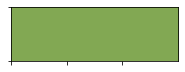

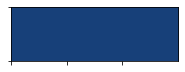

In [ ]:
colors = sns.color_palette([sns.color_palette("gist_earth_r")[2], sns.color_palette("gist_earth_r")[5]])
# The colors are:
sns.palplot(sns.color_palette("gist_earth_r")[2]), sns.palplot(sns.color_palette("gist_earth_r")[5])

Text(0, 0.5, 'COUNT')

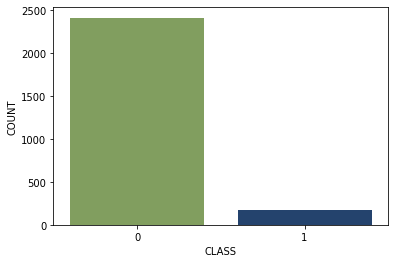

In [ ]:
sns.countplot(x=label, data=df, palette=colors)
plt.xlabel('CLASS')
plt.ylabel('COUNT')

### Categorical Feature Encoding

#### Categorical Variables Distributions

[Attribute information](https://archive.ics.uci.edu/ml/datasets/seismic-bumps):
1. seismic: result of shift seismic hazard assessment in the mine working obtained by the seismic
method (a - lack of hazard, b - low hazard, c - high hazard, d - danger state);
2. seismoacoustic: result of shift seismic hazard assessment in the mine working obtained by the
seismoacoustic method;
3. shift: information about type of a shift (W - coal-getting, N -preparation shift);


In [ ]:
for col in col_list_categorical:
    print(df[col].value_counts())

a    1682
b     902
Name: seismic, dtype: int64
a    1580
b     956
c      48
Name: seismoacoustic, dtype: int64
W    1663
N     921
Name: shift, dtype: int64
a    2342
b     212
c      30
Name: ghazard, dtype: int64


#### Contingency tables for categorical variables

In [ ]:
df.seismic.value_counts()

a    1682
b     902
Name: seismic, dtype: int64

In [ ]:
data_crosstab = pd.crosstab(df['seismic'], df[label], colnames=['class'])
data_crosstab

class,0,1
seismic,,
a,1599,83
b,815,87


Larger fraction in (b | 1)

In [ ]:
data_crosstab = pd.crosstab(df['seismoacoustic'], df[label], colnames=['class'])
data_crosstab

class,0,1
seismoacoustic,,
a,1479,101
b,890,66
c,45,3


In [ ]:
101/1479 , 66/890

(0.068289384719405, 0.07415730337078652)

Not much bias

In [ ]:
data_crosstab = pd.crosstab(df['shift'], df[label])
data_crosstab

class,0,1
shift,,
N,904,17
W,1510,153


In [ ]:
17/904 , 153/1510

(0.018805309734513276, 0.10132450331125828)

10% of the (W | 0) is 1.

In [ ]:
data_crosstab = pd.crosstab(df['ghazard'], df[label])
data_crosstab

class,0,1
ghazard,,
a,2186,156
b,198,14
c,30,0


In [ ]:
2186/156, 198/14

(14.012820512820513, 14.142857142857142)

Similar ratios

#### Encode hazard assesment with numerical values: the assessment coding being graded from Low to High, coding numerically adds meaningful information.

[Attribute information](https://archive.ics.uci.edu/ml/datasets/seismic-bumps):
1. seismic: result of shift seismic hazard assessment in the mine working obtained by the seismic
method (a - lack of hazard, b - low hazard, c - high hazard, d - danger state);
2. seismoacoustic: result of shift seismic hazard assessment in the mine working obtained by the
seismoacoustic method;
3. shift: information about type of a shift (W - coal-getting, N -preparation shift);


In [ ]:
def numeric_encoder(col_name, df):
    try:
      df[col_name + "_enc_0"] = df[col_name].map({'a': 0, 'b': 1, 'c' : 2, 'W' : 0, 'N' : 1})
      df.drop(columns=col, inplace=True)
      return df
    except Exception as e:
        print(e)
        print("Error in numeric encoding feature : " + col_name)


In [ ]:
for col in col_list_categorical:
    df = numeric_encoder(col, df)
df.shape

(2584, 19)

#### One-hot encoder: REPLACED With Numeric encoding above

In [ ]:
def one_hot_encoder(col_name, df):
    label_encoder = LabelEncoder()
    onehot_encoder = OneHotEncoder(drop='first', sparse=False)
    try:
        encoded_array = label_encoder.fit_transform(df[col_name])
        print(label_encoder.classes_)
#         SKLEARN IMPLEMENTATION
        encoded_array_reshaped = encoded_array.reshape(len(encoded_array), 1)
        one_hot_encoded_array = onehot_encoder.fit_transform(encoded_array_reshaped)
#         one_hot_encoded_array = to_categorical(encoded_array)
        print(one_hot_encoded_array)
        num_features = one_hot_encoded_array.shape[1]
        print("Number of encoded columns to add: ", num_features)
        new_enc_col_names = [col + '_enc_' + str(num) for num in range(0, num_features)] 
        df_enc = pd.DataFrame(one_hot_encoded_array)
        print("Shape of encoded df: ", df_enc.shape)
        df_enc.columns = new_enc_col_names
        print("New column names: ", new_enc_col_names)
        df = pd.concat([df, df_enc], axis=1)
        df.drop(columns=col, inplace=True)
        return df
    except Exception as e:
        print(e)
        print("Error in encoding feature : " + col_name)

In [ ]:
#for col in col_list_categorical:
#    df = one_hot_encoder(col, df)
df.shape

(2584, 19)

In [ ]:
df_raw['shift'].value_counts()

W    1663
N     921
Name: shift, dtype: int64

In [ ]:
df.shift_enc_0.value_counts()

0    1663
1     921
Name: shift_enc_0, dtype: int64

In [ ]:
df.head()

,genergy,gpuls,gdenergy,gdpuls,nbumps,nbumps2,nbumps3,nbumps4,nbumps5,nbumps6,nbumps7,nbumps89,energy,maxenergy,class,seismic_enc_0,seismoacoustic_enc_0,shift_enc_0,ghazard_enc_0
0,15180.0,48.0,-72.0,-72.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0
1,14720.0,33.0,-70.0,-79.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2000.0,2000.0,0,0,0,1,0
2,8050.0,30.0,-81.0,-78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0
3,28820.0,171.0,-23.0,40.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3000.0,3000.0,0,0,0,1,0
4,12640.0,57.0,-63.0,-52.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2584 entries, 0 to 2583
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   genergy               2584 non-null   float64
 1   gpuls                 2584 non-null   float64
 2   gdenergy              2584 non-null   float64
 3   gdpuls                2584 non-null   float64
 4   nbumps                2584 non-null   float64
 5   nbumps2               2584 non-null   float64
 6   nbumps3               2584 non-null   float64
 7   nbumps4               2584 non-null   float64
 8   nbumps5               2584 non-null   float64
 9   nbumps6               2584 non-null   float64
 10  nbumps7               2584 non-null   float64
 11  nbumps89              2584 non-null   float64
 12  energy                2584 non-null   float64
 13  maxenergy             2584 non-null   float64
 14  class                 2584 non-null   int64  
 15  seismic_enc_0        

Notice that after one hot encoding, thate object types changed to floats.

### Numeric Feature Scaling

In [ ]:
df[col_list_numerical].describe()

,genergy,gpuls,gdenergy,gdpuls,energy,maxenergy
count,2.584000e+03,2584.000000,2584.000000,2584.000000,2584.000000,2584.000000
mean,9.024252e+04,538.579334,12.375774,4.508901,4975.270898,4278.850619
std,2.292005e+05,562.652536,80.319051,63.166556,20450.833222,19357.454882
min,1.000000e+02,2.000000,-96.000000,-96.000000,0.000000,0.000000
25%,1.166000e+04,190.000000,-37.000000,-36.000000,0.000000,0.000000
50%,2.548500e+04,379.000000,-6.000000,-6.000000,0.000000,0.000000
75%,5.283250e+04,669.000000,38.000000,30.250000,2600.000000,2000.000000
max,2.595650e+06,4518.000000,1245.000000,838.000000,402000.000000,400000.000000


In [ ]:
df_corr = df[col_list_numerical].corr()

In [ ]:
df_corr

,genergy,gpuls,gdenergy,gdpuls,energy,maxenergy
genergy,1.000000,0.748020,0.048514,0.071554,0.080828,0.064405
gpuls,0.748020,1.000000,0.293036,0.382906,0.187350,0.164263
gdenergy,0.048514,0.293036,1.000000,0.811944,0.105971,0.108572
gdpuls,0.071554,0.382906,0.811944,1.000000,0.143277,0.143646
energy,0.080828,0.187350,0.105971,0.143277,1.000000,0.989547
maxenergy,0.064405,0.164263,0.108572,0.143646,0.989547,1.000000


(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5]),
 <a list of 6 Text major ticklabel objects>)

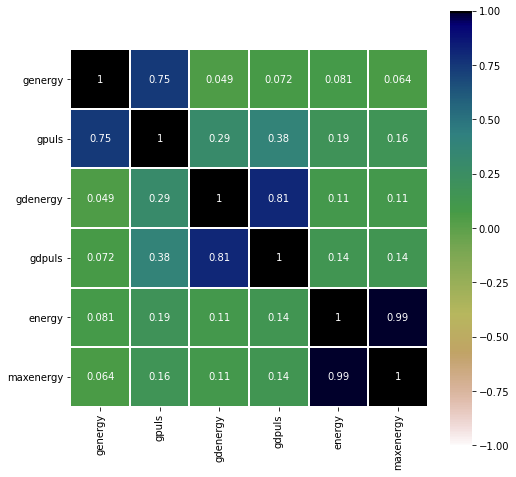

In [ ]:
plt.figure(figsize=[8, 8])
sns.heatmap(data=df_corr, vmin=-1, vmax=1, cmap='gist_earth_r', annot=True, square=True, linewidths=1)
plt.xticks(rotation=90)
plt.yticks(rotation=0)

#### genergy and gpuls

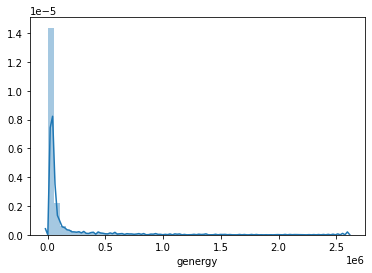

In [ ]:
sns.distplot(df['genergy'], hist=True)

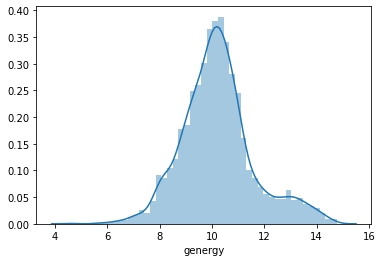

In [ ]:
sns.distplot(np.log(df['genergy']), hist=True)

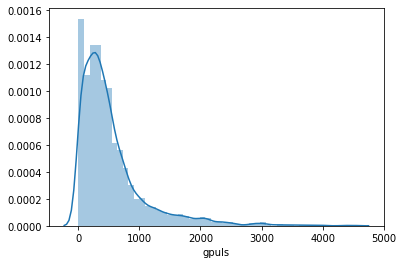

In [ ]:
sns.distplot(df['gpuls'], hist=True)

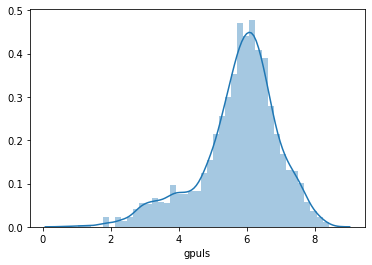

In [ ]:
sns.distplot(np.log(df['gpuls']), hist=True)

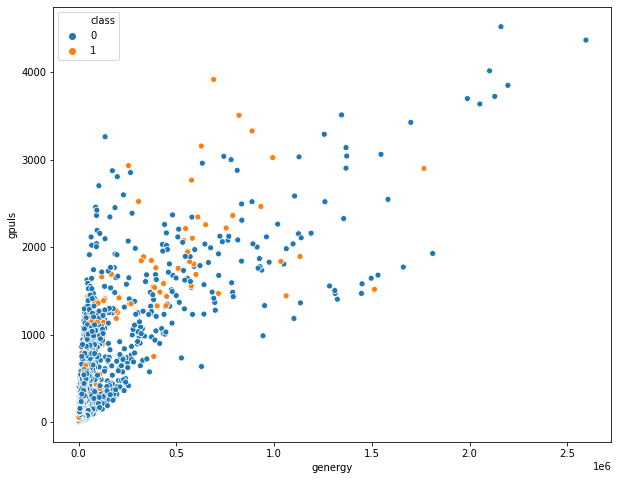

In [ ]:
plt.figure(figsize=[10, 8])
sns.scatterplot(x='genergy', y='gpuls', hue='class', data=df)

In [ ]:
# Applying log transform

df['log_t_genergy'] = np.log(df['genergy'])
df['log_t_gpuls'] = np.log(df['gpuls'])

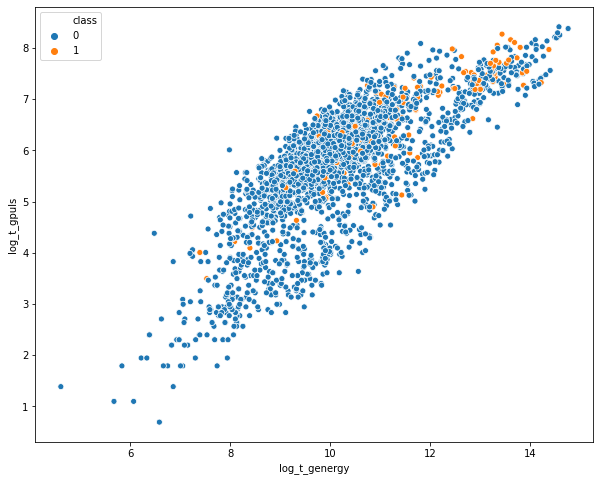

In [ ]:
plt.figure(figsize=[10, 8])
sns.scatterplot(x='log_t_genergy', y='log_t_gpuls', hue='class', data=df)

In [ ]:
df.drop(columns=['log_t_genergy', 'log_t_gpuls'], inplace=True)

#### gdenergy and gdpuls

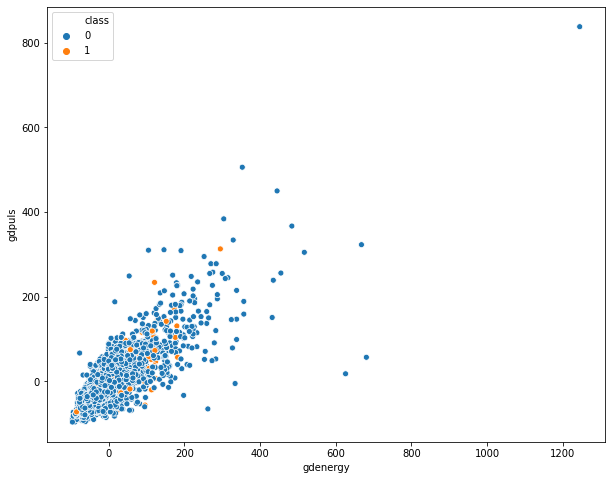

In [ ]:
plt.figure(figsize=[10, 8])
sns.scatterplot(x='gdenergy', y='gdpuls', hue='class', data=df)

There are negative shifts in gdenergy and gdpuls because of which log transformation is not going to be the best choice. So, trying out square root transformation.

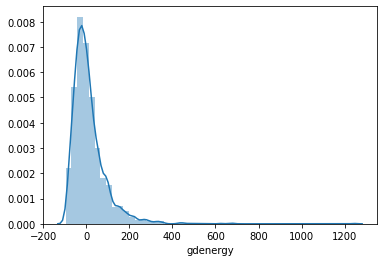

In [ ]:
sns.distplot(df['gdenergy'], hist=True)

There are some negative shifts here.

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


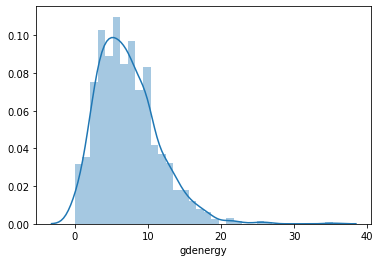

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


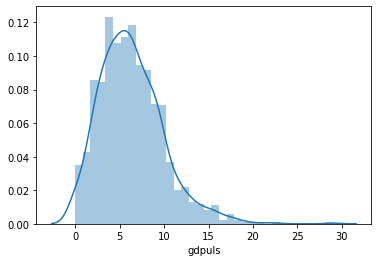

In [ ]:
sns.distplot(np.sqrt(df['gdenergy']), hist=True)
plt.show()
sns.distplot(np.sqrt(df['gdpuls']), hist=True)

.. and trying out standard transformation

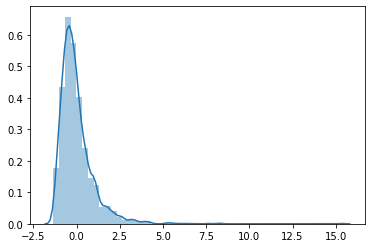

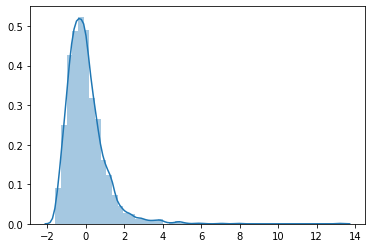

In [ ]:
sns.distplot(stats.zscore(df['gdenergy']), hist=True)
plt.show()
sns.distplot(stats.zscore(df['gdpuls']), hist=True)

#### energy and maxenergy

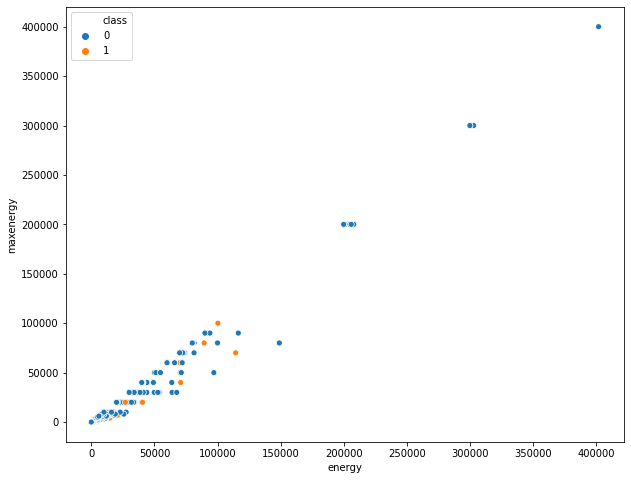

In [ ]:
plt.figure(figsize=[10, 8])
sns.scatterplot(x='energy', y='maxenergy', hue='class', data=df)

A strong linear relationship is here betwen the two features.

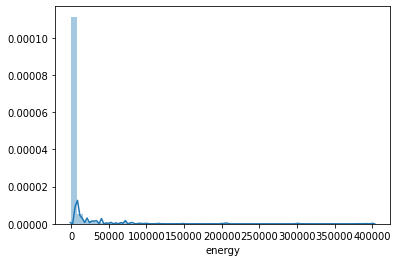

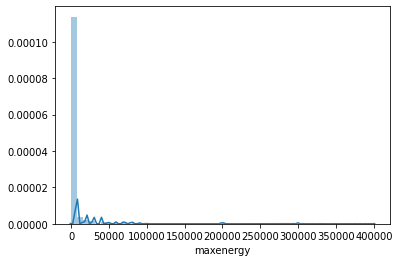

In [ ]:
sns.distplot(df['energy'], hist=True)
plt.show()
sns.distplot(df['maxenergy'], hist=True)
plt.show()

There is a lot of zeroes in this feature. Therefore, using zscore again to check the distribution.

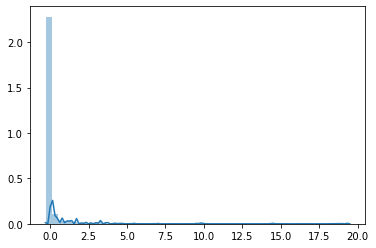

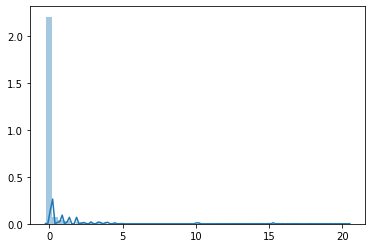

In [ ]:
sns.distplot(stats.zscore(df['energy']), hist=True)
plt.show()
sns.distplot(stats.zscore(df['maxenergy']), hist=True)
plt.show()

In [ ]:
stats.zscore(df['energy']).mean(), stats.zscore(df['maxenergy']).mean()

(2.1998227113315797e-17, -1.0999113556657898e-17)

Trying log transformation after adding a constant 1

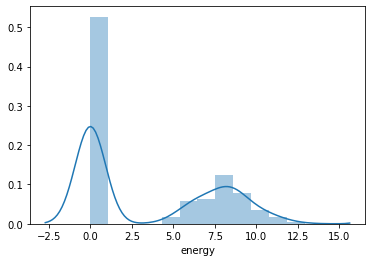

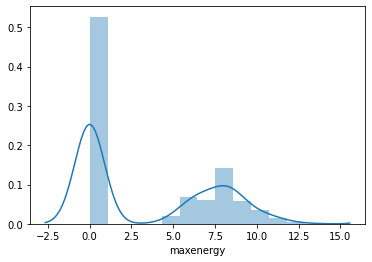

In [ ]:
sns.distplot(np.log(df['energy']+1), hist=True)
plt.show()
sns.distplot(np.log(df['maxenergy']+1), hist=True)
plt.show()

For energy and maxenergy, there is little differences in the distributions as in the plots and there is almost 100% correlation in the data - so I would drop maxenergy and keep energy only. I would translate using a constant 1 and then use log transformation on energy.

**Summarizing the chosen transformation in a dictionary**

In [ ]:
def shifted_log_func(df_col):
    return np.log(1 + df_col) 

In [ ]:
dict_num_cols_trnsfm = {'genergy': np.log,
                        'gpuls' : np.log,
                        'gdenergy': stats.zscore,
                        'gdenergy': stats.zscore, 
                        'energy': shifted_log_func}

In [ ]:
for col_names, transfm_func in dict_num_cols_trnsfm.items():
    df['scaled_' + col_names] = transfm_func(df[col_names])
df.drop(columns=col_list_numerical, inplace=True)
df.head()

,nbumps,nbumps2,nbumps3,nbumps4,nbumps5,nbumps6,nbumps7,nbumps89,class,seismic_enc_0,seismoacoustic_enc_0,shift_enc_0,ghazard_enc_0,scaled_genergy,scaled_gpuls,scaled_gdenergy,scaled_energy
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,9.627734,3.871201,-1.050711,0.000000
1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,9.596962,3.496508,-1.025805,7.601402
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,8.993427,3.401197,-1.162786,0.000000
3,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,10.268825,5.141664,-0.440526,8.006701
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,9.444622,4.043051,-0.938636,0.000000


In [ ]:
df[[col for col in df.columns if 'scaled_' in col]].describe()

,scaled_genergy,scaled_gpuls,scaled_gdenergy,scaled_energy
count,2584.000000,2584.000000,2.584000e+03,2584.000000
mean,10.221063,5.761759,-1.895199e-16,3.481643
std,1.393919,1.173926,1.000194e+00,4.117081
min,4.605170,0.693147,-1.349577e+00,0.000000
25%,9.363919,5.247024,-6.148645e-01,0.000000
50%,10.145845,5.937536,-2.288290e-01,0.000000
75%,10.874880,6.505784,3.190922e-01,7.863651
max,14.769348,8.415825,1.534957e+01,12.904210


### Discrete Features

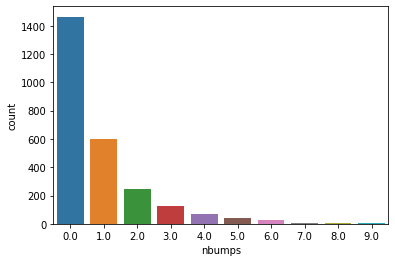

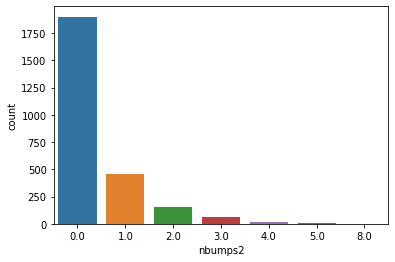

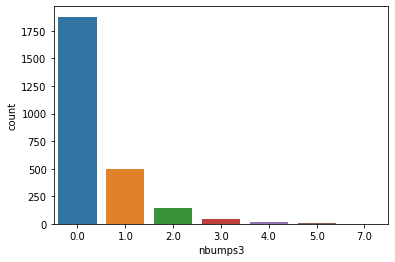

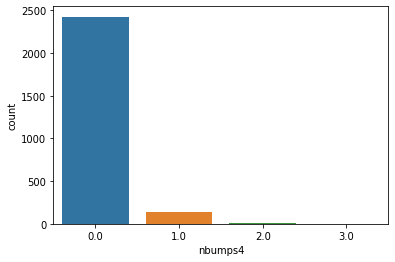

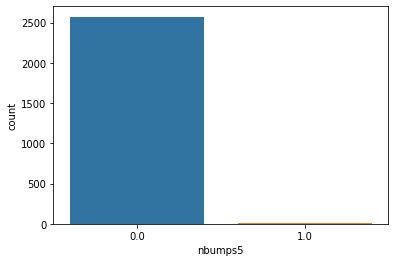

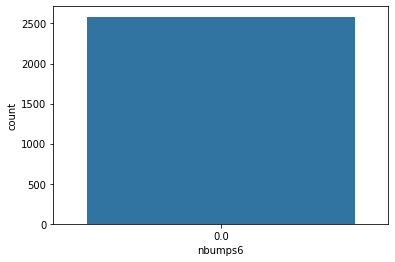

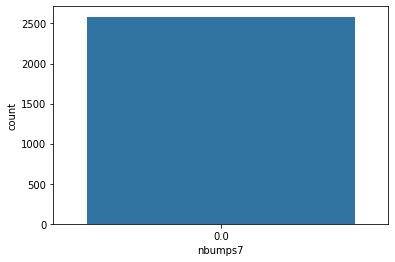

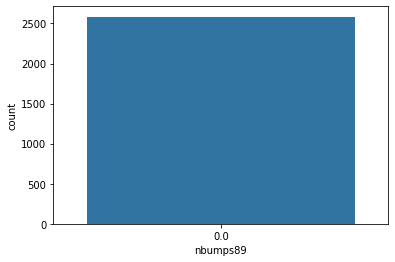

In [ ]:
for col in col_list_discrete:
    sns.countplot(df[col])
    plt.show()

Since nbumps 6 , 7 & 89 contain zero, I will drop them as they have no information.

In [ ]:
df.drop(columns=['nbumps6', 'nbumps7', 'nbumps89'], inplace=True)

In [ ]:
df.head()

,nbumps,nbumps2,nbumps3,nbumps4,nbumps5,class,seismic_enc_0,seismoacoustic_enc_0,shift_enc_0,ghazard_enc_0,scaled_genergy,scaled_gpuls,scaled_gdenergy,scaled_energy
0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,9.627734,3.871201,-1.050711,0.000000
1,1.0,0.0,1.0,0.0,0.0,0,0,0,1,0,9.596962,3.496508,-1.025805,7.601402
2,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,8.993427,3.401197,-1.162786,0.000000
3,1.0,0.0,1.0,0.0,0.0,0,0,0,1,0,10.268825,5.141664,-0.440526,8.006701
4,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,9.444622,4.043051,-0.938636,0.000000


In [ ]:
col_list_discrete = list(set(col_list_discrete) - set(['nbumps6', 'nbumps7', 'nbumps89']))
col_list_discrete

['nbumps5', 'nbumps3', 'nbumps', 'nbumps2', 'nbumps4']

In [ ]:
for each_col in col_list_discrete:
    data_crosstab = pd.crosstab(df[each_col], df[label], colnames=['class'])
    print(data_crosstab)
    print('-----')

class       0    1
nbumps5           
0.0      2403  169
1.0        11    1
-----
class       0   1
nbumps3          
0.0      1806  73
1.0       442  55
2.0       115  25
3.0        35   7
4.0        12   8
5.0         3   2
7.0         1   0
-----
class      0   1
nbumps          
0.0     1424  40
1.0      567  31
2.0      208  37
3.0       96  31
4.0       59  10
5.0       30   8
6.0       19   9
7.0        3   2
8.0        6   1
9.0        2   1
-----
class       0   1
nbumps2          
0.0      1832  69
1.0       399  56
2.0       122  29
3.0        47  11
4.0         8   4
5.0         5   1
8.0         1   0
-----
class       0    1
nbumps4           
0.0      2278  148
1.0       123   20
2.0        12    1
3.0         1    1
-----


## Correlations between features and the target

In [ ]:
df.shape

(2584, 14)

In [ ]:
df.describe()

,nbumps,nbumps2,nbumps3,nbumps4,nbumps5,class,seismic_enc_0,seismoacoustic_enc_0,shift_enc_0,ghazard_enc_0,scaled_genergy,scaled_gpuls,scaled_gdenergy,scaled_energy
count,2584.000000,2584.000000,2584.000000,2584.000000,2584.000000,2584.000000,2584.000000,2584.000000,2584.000000,2584.000000,2584.000000,2584.000000,2.584000e+03,2584.000000
mean,0.859520,0.393576,0.392802,0.067724,0.004644,0.065789,0.349071,0.407121,0.356424,0.105263,10.221063,5.761759,-1.895199e-16,3.481643
std,1.364616,0.783772,0.769710,0.279059,0.068001,0.247962,0.476769,0.527857,0.479035,0.342707,1.393919,1.173926,1.000194e+00,4.117081
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.605170,0.693147,-1.349577e+00,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.363919,5.247024,-6.148645e-01,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.145845,5.937536,-2.288290e-01,0.000000
75%,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,10.874880,6.505784,3.190922e-01,7.863651
max,9.000000,8.000000,7.000000,3.000000,1.000000,1.000000,1.000000,2.000000,1.000000,2.000000,14.769348,8.415825,1.534957e+01,12.904210


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5]), <a list of 14 Text major ticklabel objects>)

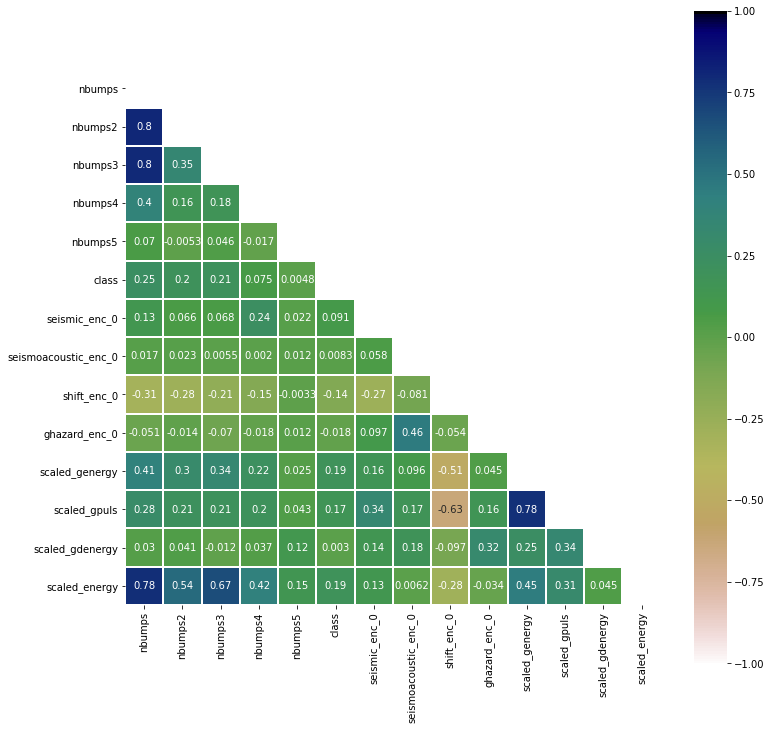

In [ ]:
df_corr = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(df_corr, dtype=bool))

plt.figure(figsize=[12, 12])
sns.heatmap(data=df_corr, mask=mask, vmin=-1, vmax=1, cmap='gist_earth_r', annot=True, square=True, linewidths=1)
plt.xticks(rotation=90)
plt.yticks(rotation=0)

## Splitting Traning and Test data using Stratified Shuffle Split

In [ ]:
df.shape

(2584, 14)

In [ ]:
X_cols = list(set(df.columns) - set([label]))
X_cols

['ghazard_enc_0',
 'nbumps5',
 'scaled_energy',
 'nbumps3',
 'shift_enc_0',
 'nbumps',
 'seismoacoustic_enc_0',
 'nbumps2',
 'seismic_enc_0',
 'scaled_gpuls',
 'scaled_gdenergy',
 'scaled_genergy',
 'nbumps4']

In [ ]:
# OLD CODE FOR DEMO
X_demo = df[list(set(df.columns) - set([label]))]
y_demo1 = df[label]
y_demo2 = df[[label]]
X_demo.shape, y_demo1.shape, y_demo2.shape

((2584, 13), (2584,), (2584, 1))

In [ ]:
type(X_demo), type(y_demo1), type(y_demo2)

(pandas.core.frame.DataFrame,
 pandas.core.series.Series,
 pandas.core.frame.DataFrame)

In [ ]:
X = df[list(set(df.columns) - set([label]))].values
y = df[label]
X.shape, y.shape

((2584, 13), (2584,))

In [ ]:
type(X), type(y)

(numpy.ndarray, pandas.core.series.Series)

In [ ]:
stratified_split = StratifiedShuffleSplit(n_splits=1, test_size=0.20)

In [ ]:
for train_idx, test_idx in stratified_split.split(X, y):
    print(len(train_idx))
    print(len(test_idx))
    y_train= y[train_idx]
    X_train = X[train_idx]
    X_test, y_test = X[test_idx], y[test_idx]

len(X_train), len(y_train), len(X_test), len(y_test)

2067
517


(2067, 2067, 517, 517)

In [ ]:
print("Training Set Target Class Distribution:")
print(y_train.value_counts()/len(y_train))
print("Test Set Target Class Distribution:")
print(y_test.value_counts()/len(y_test))

Training Set Target Class Distribution:
0    0.934204
1    0.065796
Name: class, dtype: float64
Test Set Target Class Distribution:
0    0.934236
1    0.065764
Name: class, dtype: float64


In [ ]:
X_train = pd.DataFrame(X_train, columns=X_cols)
X_test = pd.DataFrame(X_test, columns=X_cols)

In [ ]:
X_train_demo, X_test_demo, y_train_demo, y_test_demo = train_test_split(X, y, test_size=0.33, random_state=42, shuffle=False)
X_train_demo.shape, X_test_demo.shape, y_train_demo.shape, y_test_demo.shape, y_train_demo.value_counts()/len(y_train_demo), y_test_demo.value_counts()/len(y_test_demo)

((1731, 13), (853, 13), (1731,), (853,), 0    0.9197
 1    0.0803
 Name: class, dtype: float64, 0    0.963658
 1    0.036342
 Name: class, dtype: float64)

In [ ]:
print("Training Set Target Class Distribution:")
print(y_train_demo.value_counts()/len(y_train_demo))
print("Test Set Target Class Distribution:")
print(y_test_demo.value_counts()/len(y_test_demo))

Training Set Target Class Distribution:
0    0.9197
1    0.0803
Name: class, dtype: float64
Test Set Target Class Distribution:
0    0.963658
1    0.036342
Name: class, dtype: float64


In [ ]:
X_train_demo, X_test_demo, y_train_demo, y_test_demo = train_test_split(X, y, test_size=0.33, 
                                                                        random_state=42, shuffle=True)
X_train_demo.shape, X_test_demo.shape, y_train_demo.shape, y_test_demo.shape, y_train_demo.value_counts()/len(y_train_demo), y_test_demo.value_counts()/len(y_test_demo)

((1731, 13), (853, 13), (1731,), (853,), 0    0.935875
 1    0.064125
 Name: class, dtype: float64, 0    0.930832
 1    0.069168
 Name: class, dtype: float64)

In [ ]:
print("Training Set Target Class Distribution:")
print(y_train_demo.value_counts()/len(y_train_demo))
print("Test Set Target Class Distribution:")
print(y_test_demo.value_counts()/len(y_test_demo))

Training Set Target Class Distribution:
0    0.935875
1    0.064125
Name: class, dtype: float64
Test Set Target Class Distribution:
0    0.930832
1    0.069168
Name: class, dtype: float64


## NEW Generate Training Set with high Class 1 with SMOTE

In [ ]:
counter = Counter(y_train)
print(counter)

Counter({0: 1931, 1: 136})


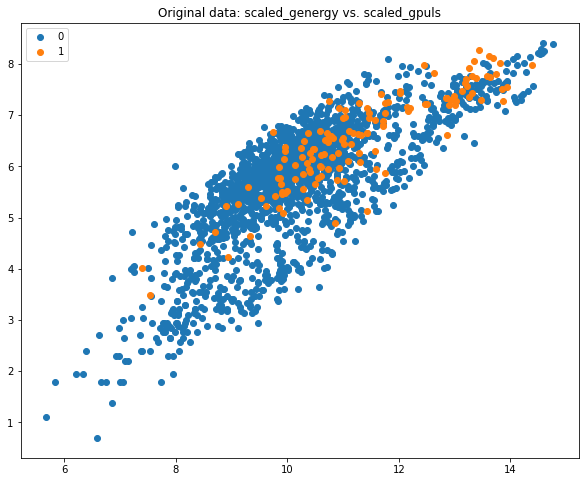

In [ ]:
#sns.scatterplot(x='scaled_genergy', y='scaled_gpuls', hue=class, data=X_train)

# View current data
plt.figure(figsize=[10, 8])


for lb, _ in counter.items():
	row_ix = np.where(y_train == lb)[0]
	plt.scatter(X_train.loc[row_ix, ['scaled_genergy']], 
	            X_train.loc[row_ix, ['scaled_gpuls']], label=str(lb))

	#plt.scatter(X[y == label].scaled_genergy, X[y == label].scaled_gpuls, label=str(label))
plt.title("Original data: scaled_genergy vs. scaled_gpuls")
plt.legend()
plt.show()

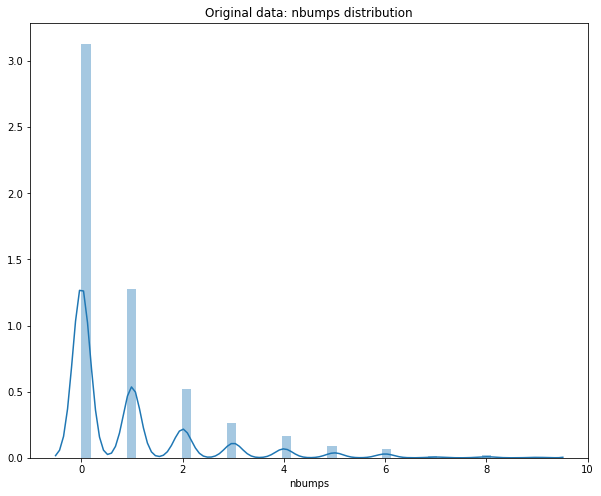

In [ ]:
plt.figure(figsize=[10, 8])

sns.distplot(X_train['nbumps'])
plt.title("Original data: nbumps distribution")

plt.show()

In [ ]:
print('Original dataset shape %s' % Counter(y))

sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X_train, y_train)

print('Resampled dataset shape %s' % Counter(y_res))

X_res = pd.DataFrame(X_res, columns=X_cols)

Original dataset shape Counter({0: 2414, 1: 170})
Resampled dataset shape Counter({0: 1931, 1: 1931})


/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


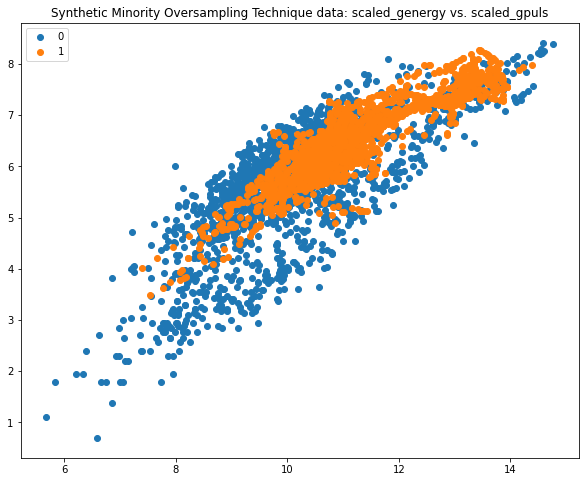

In [ ]:
plt.figure(figsize=[10, 8])
plt.title("Synthetic Minority Oversampling Technique data: scaled_genergy vs. scaled_gpuls")

for lb, _ in counter.items():
	row_ix = np.where(y_res == lb)[0]
	plt.scatter(X_res.loc[y_res == lb, ['scaled_genergy']], 
	            X_res.loc[y_res == lb, ['scaled_gpuls']], label=str(lb))



plt.legend()
plt.show()

*Some non-natural number of Bumps! (float values!)*

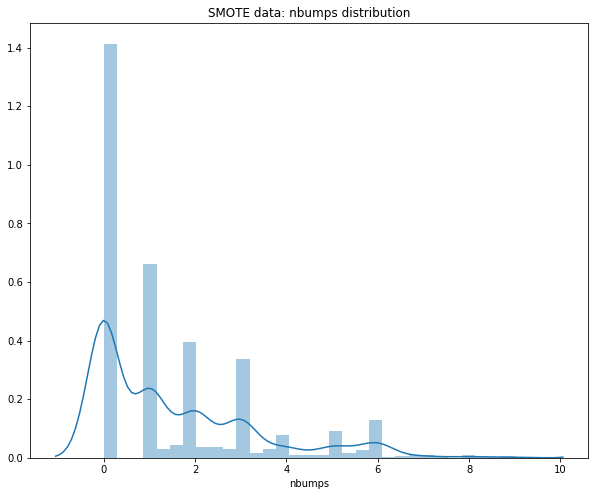

In [ ]:

plt.figure(figsize=[10, 8])

sns.distplot(X_res['nbumps'])
plt.title("SMOTE data: nbumps distribution")

plt.show()

## Save models to a particular folder

In [ ]:
import datetime

def model_store_location():
    return "model-store-{}".format(datetime.date.today())

model_store_location = model_store_location()
print(model_store_location)
!mkdir {model_store_location}
model_store_location += '/'
model_store_location

model-store-2020-09-23
mkdir: cannot create directory ‘model-store-2020-09-23’: File exists


'model-store-2020-09-23/'

## Applying ML model to Predict Hazardrous Seismic Bump

### K-Neighbors Classifier using Stratified KFold Cross Validation

#### Establishing Baseline

In [ ]:
model = KNeighborsClassifier()
skf = StratifiedKFold(n_splits=5)

In [ ]:
'''
Demo of split using original features and label columns
split is 90-10
'''

for train, test in skf.split(X, y):
    print(len(train))
    print(y[train].value_counts()/len(train))
    print('----')
    print(len(test))
    print(y[test].value_counts()/len(test))
    print('----')
    break

2067
0    0.934204
1    0.065796
Name: class, dtype: float64
----
517
0    0.934236
1    0.065764
Name: class, dtype: float64
----


#### Using cross_val_score for performance metrics

In [ ]:
scores = cross_val_score(model, X_train, y_train, scoring='accuracy', cv=skf, n_jobs=-1, error_score='raise')
scores

array([0.92753623, 0.92753623, 0.92251816, 0.93220339, 0.92978208])

In [ ]:
scores.mean(), scores.std()

(0.9279152191458749, 0.0032027831069952636)

In [ ]:
scores = cross_val_score(model, X_train, y_train, scoring='f1', cv=skf, n_jobs=-1, error_score='raise')
scores.mean(), scores.std()

(0.09599146110056925, 0.0456939480863515)

I was getting an error "pos_label=1 is not a valid label: array(['0', '1'], dtype='<U1')" which I resolved by typecasting the labels into integers. This blocked me for 1 whole day sicne I had run the code before which successfully ran. This is when i noticed one-hot encoders transformed all the features I fed into it were transformed to float including my label column. So when I ran the code, it worked. But when I  excluded it, the object type of the label column caused this trouble.

In [ ]:
model.n_neighbors, model.weights

(5, 'uniform')

In [ ]:
t0= time.perf_counter()

model.fit(X_train, y_train)

t1 = time.perf_counter() - t0

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
confusion_matrix(y_test, y_pred)

array([[481,   2],
       [ 33,   1]])

In [ ]:
y_test.value_counts()


0    483
1     34
Name: class, dtype: int64

In [ ]:
pd.Series( y_pred).value_counts()

0    514
1      3
dtype: int64

#### Add model results to a DataFrame

In [ ]:
df_results = pd.DataFrame(index = ['scoring_technique', 'algorithm', 'n_neighbors', 'weights', 'leaf_size', 'accuracy', 'precision', 'recall', 'f1-score', 'Time_to_run_seconds'])

In [ ]:
df_results['KNC Baseline'] = ['None', model.algorithm,
                          model.n_neighbors, 
                          model.weights, 
                          model.leaf_size,
                          accuracy_score(y_test, y_pred), 
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), t1]

In [ ]:
df_results

,KNC Baseline
scoring_technique,None
algorithm,auto
n_neighbors,5
weights,uniform
leaf_size,30
accuracy,0.932302
precision,0.333333
recall,0.0294118
f1-score,0.0540541
Time_to_run_seconds,0.00902895


In [ ]:
import sklearn
sorted(sklearn.metrics.SCORERS.keys())

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'max_error',
 'mutual_info_score',
 'neg_brier_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_gamma_deviance',
 'neg_mean_poisson_deviance',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'neg_root_mean_squared_error',
 'normalized_mutual_info_score',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',
 'roc_auc',
 'roc_auc_ovo',
 'roc_auc_ovo_weighted',
 'roc_auc_ovr',
 'roc_auc_ovr_weighted',
 'v_measure_score']

#### Using cross_validate for performance metrics

In [ ]:
scores = cross_validate(model, X_train, y_train, scoring=['precision', 'recall', 'f1'], cv=skf, n_jobs=-1, error_score='raise')
scores.keys()

dict_keys(['fit_time', 'score_time', 'test_precision', 'test_recall', 'test_f1'])

In [ ]:
scores['test_precision'].mean(), scores['test_recall'].mean(), scores['test_f1'].mean()

(0.27095238095238094, 0.05873015873015873, 0.09599146110056925)

In [ ]:
scoring = {'precision': 'precision', 
           'recall': 'recall',
           'roc_auc': 'roc_auc'}

In [ ]:
scores = cross_validate(model, X_train, y_train, scoring=scoring, cv=10, return_train_score=True)
sorted(scores.keys())

['fit_time',
 'score_time',
 'test_precision',
 'test_recall',
 'test_roc_auc',
 'train_precision',
 'train_recall',
 'train_roc_auc']

In [ ]:
scores['test_precision'].mean(), scores['test_recall'].mean(), scores['test_roc_auc'].mean()

(0.24166666666666664, 0.05769230769230769, 0.6482443468608737)

#### Tuning model using Grid Search CV using 'Precision'

In [ ]:
n_neighbors = [1, 2, 3, 4, 5]
weights = ['uniform', 'distance']
algorithm = ['ball_tree', 'kd_tree', 'brute']
leaf_size = [10, 20, 30 , 40, 50]

param_grid = dict(n_neighbors=n_neighbors, weights=weights, algorithm=algorithm, leaf_size=leaf_size)

In [ ]:

grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid, 
                    cv=StratifiedKFold(shuffle=True), 
                    scoring=['precision'],
                    refit='precision',
                    verbose=1,
                    n_jobs=-1)





In [ ]:
t0= time.perf_counter()
grid_result = grid.fit(X_train, y_train)

t1 = time.perf_counter() - t0

grid_result.best_estimator_



Fitting 5 folds for each of 150 candidates, totalling 750 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 750 out of 750 | elapsed:   13.0s finished


KNeighborsClassifier(algorithm='ball_tree', leaf_size=10, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')

In [ ]:
print("Time elapsed: ", t1) # CPU seconds elapsed (floating point)

grid_result.best_estimator_

Time elapsed:  13.03174707900007


KNeighborsClassifier(algorithm='ball_tree', leaf_size=10, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')

In [ ]:
grid_result.best_score_

0.3

In [ ]:
n_neighbors, weights = grid_result.best_estimator_.n_neighbors , grid_result.best_estimator_.weights

In [ ]:
n_neighbors, weights

(3, 'uniform')

In [ ]:
grid_result.scorer_

{'precision': make_scorer(precision_score, average=binary)}

In [ ]:
grid_result.n_splits_

5

In [ ]:
model = grid_result.best_estimator_

In [ ]:
model

KNeighborsClassifier(algorithm='ball_tree', leaf_size=10, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')

In [ ]:
file_name = 'seismic_bump_k_neighbors_'+ str(n_neighbors) + '_' + weights + '_' + list(grid_result.scorer_.keys())[0]+'.sav'
joblib.dump(model, model_store_location + file_name)

['model-store-2020-09-23/seismic_bump_k_neighbors_3_uniform_precision.sav']

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
y_pred.shape

(517,)

In [ ]:
confusion_matrix(y_test, y_pred)

array([[479,   4],
       [ 32,   2]])

In [ ]:
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
(tn, fp, fn, tp)

(479, 4, 32, 2)

In [ ]:
accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred), f1_score(y_test, y_pred)

(0.9303675048355899, 0.058823529411764705, 0.3333333333333333, 0.1)

In [ ]:
df_results['KNC Model 1'] = [grid.get_params(deep=True)['scoring'], grid_result.best_estimator_.algorithm,
                         n_neighbors, weights, grid_result.best_estimator_.leaf_size,
                         accuracy_score(y_test, y_pred), 
                         precision_score(y_test, y_pred), recall_score(y_test, y_pred), 
                         f1_score(y_test, y_pred), t1]

In [ ]:
df_results

,KNC Baseline,KNC Model 1
scoring_technique,None,[precision]
algorithm,auto,ball_tree
n_neighbors,5,3
weights,uniform,uniform
leaf_size,30,10
accuracy,0.932302,0.930368
precision,0.333333,0.333333
recall,0.0294118,0.0588235
f1-score,0.0540541,0.1
Time_to_run_seconds,0.00902895,13.0317


#### Tuning model using Grid Search CV using 'Precision'  again

In [ ]:
t0= time.perf_counter()

grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid, 
                    cv=StratifiedKFold(shuffle=True), 
                    scoring=['precision'],
                    refit='precision',
                    verbose=10, n_jobs=-1)
grid_result = grid.fit(X_train, y_train)

t1 = time.perf_counter() - t0

n_neighbors, weights = grid_result.best_estimator_.n_neighbors , grid_result.best_estimator_.weights
file_name = 'seismic_bump_k_neighbors_'+ str(n_neighbors) + '_' + weights + '_' + list(grid_result.scorer_.keys())[0]+'.sav'
joblib.dump(model, model_store_location + file_name)
print(grid_result.best_score_)
print(grid_result.best_estimator_)
y_pred = grid_result.best_estimator_.predict(X_test)

accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred), f1_score(y_test, y_pred)

Fitting 5 folds for each of 150 candidates, totalling 750 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0459s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1106s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1948s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 300 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 388 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 476 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 580 tasks      | elapsed:  

0.1801010101010101
KNeighborsClassifier(algorithm='ball_tree', leaf_size=10, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=4, p=2,
                     weights='distance')


[Parallel(n_jobs=-1)]: Done 750 out of 750 | elapsed:   12.7s finished


(0.9303675048355899, 0.029411764705882353, 0.25, 0.05263157894736842)

In [ ]:
df_results['KNC Model 2'] = [grid.get_params(deep=True)['scoring'], grid_result.best_estimator_.algorithm,
                         n_neighbors, weights, grid_result.best_estimator_.leaf_size,
                         accuracy_score(y_test, y_pred), precision_score(y_test, y_pred), 
                         recall_score(y_test, y_pred), f1_score(y_test, y_pred), t1]

#### Tuning model using Grid Search CV using 'Recall' 

In [ ]:
t0= time.perf_counter()

grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid, 
                    cv=StratifiedKFold(shuffle=True), 
                    scoring=['recall'],
                    refit='recall',
                    verbose=1, n_jobs=-1)
grid_result = grid.fit(X_train, y_train)

t1 = time.perf_counter() - t0

n_neighbors, weights = grid_result.best_estimator_.n_neighbors , grid_result.best_estimator_.weights
file_name = 'seismic_bump_k_neighbors_'+ str(n_neighbors) + '_' + weights + '_' + list(grid_result.scorer_.keys())[0]+'.sav'
joblib.dump(model, model_store_location + file_name)
print(grid_result.best_score_)
print(grid_result.best_estimator_)
y_pred = grid_result.best_estimator_.predict(X_test)

accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred), f1_score(y_test, y_pred)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 5 folds for each of 150 candidates, totalling 750 fits


[Parallel(n_jobs=-1)]: Done 300 tasks      | elapsed:    5.2s


0.11825396825396825
KNeighborsClassifier(algorithm='ball_tree', leaf_size=10, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')


[Parallel(n_jobs=-1)]: Done 750 out of 750 | elapsed:   12.5s finished


(0.8878143133462283,
 0.029411764705882353,
 0.038461538461538464,
 0.03333333333333333)

In [ ]:
df_results['KNC Model 3'] = [grid.get_params(deep=True)['scoring'], grid_result.best_estimator_.algorithm,
                         n_neighbors, weights, grid_result.best_estimator_.leaf_size,
                         accuracy_score(y_test, y_pred), 
                         precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred), t1]

In [ ]:
df_results

,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3
scoring_technique,None,[precision],[precision],[recall]
algorithm,auto,ball_tree,ball_tree,ball_tree
n_neighbors,5,3,4,1
weights,uniform,uniform,distance,uniform
leaf_size,30,10,10,10
accuracy,0.932302,0.930368,0.930368,0.887814
precision,0.333333,0.333333,0.25,0.0384615
recall,0.0294118,0.0588235,0.0294118,0.0294118
f1-score,0.0540541,0.1,0.0526316,0.0333333
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856


#### Tuning model using Grid Search CV using 'f1' 

In [ ]:
t0= time.perf_counter()
grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid, 
                    cv=StratifiedKFold(shuffle=True), 
                    scoring=['f1'],
                    refit='f1',
                    verbose=1)
grid_result = grid.fit(X_train, y_train)

t1 = time.perf_counter() - t0

n_neighbors, weights = grid_result.best_estimator_.n_neighbors , grid_result.best_estimator_.weights
file_name = 'seismic_bump_k_neighbors_'+ str(n_neighbors) + '_' + weights + '_' + list(grid_result.scorer_.keys())[0]+'.sav'
joblib.dump(model, model_store_location + file_name)
print(grid_result.best_score_)
print(grid_result.best_estimator_)
y_pred = grid_result.best_estimator_.predict(X_test)

accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred), f1_score(y_test, y_pred)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 150 candidates, totalling 750 fits
0.12273868541127142
KNeighborsClassifier(algorithm='ball_tree', leaf_size=10, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')


[Parallel(n_jobs=1)]: Done 750 out of 750 | elapsed:   17.7s finished


(0.8878143133462283,
 0.029411764705882353,
 0.038461538461538464,
 0.03333333333333333)

In [ ]:
df_results['KNC Model 4'] = [grid.get_params(deep=True)['scoring'], grid_result.best_estimator_.algorithm,
                         n_neighbors, weights, grid_result.best_estimator_.leaf_size, 
                         accuracy_score(y_test, y_pred), precision_score(y_test, y_pred), 
                         recall_score(y_test, y_pred), f1_score(y_test, y_pred), t1]

#### Tuning model using Grid Search CV using 'Precision' again

In [ ]:
t0= time.perf_counter()

grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid, 
                    cv=StratifiedKFold(shuffle=True), 
                    scoring=['precision'],
                    refit='precision',
                    verbose=10, n_jobs=-1)
grid_result = grid.fit(X_train, y_train)

t1 = time.perf_counter() - t0

n_neighbors, weights = grid_result.best_estimator_.n_neighbors , grid_result.best_estimator_.weights
file_name = 'seismic_bump_k_neighbors_'+ str(n_neighbors) + '_' + weights + '_' + list(grid_result.scorer_.keys())[0]+'.sav'
print(file_name)
joblib.dump(model, model_store_location + file_name)
print(grid_result.best_score_)
print(grid_result.best_estimator_)
y_pred = grid_result.best_estimator_.predict(X_test)

accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred), f1_score(y_test, y_pred)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0526s.) Setting batch_size=2.


Fitting 5 folds for each of 150 candidates, totalling 750 fits


[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0998s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1885s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 300 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 388 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 476 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 580 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done 684 tasks      | elapsed:   11.5s


seismic_bump_k_neighbors_5_uniform_precision.sav
0.24238095238095236
KNeighborsClassifier(algorithm='ball_tree', leaf_size=10, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')


[Parallel(n_jobs=-1)]: Done 750 out of 750 | elapsed:   12.6s finished


(0.9323017408123792,
 0.029411764705882353,
 0.3333333333333333,
 0.05405405405405406)

In [ ]:
df_results['KNC Model 5'] = [grid.get_params(deep=True)['scoring'], grid_result.best_estimator_.algorithm,
                         n_neighbors, weights, grid_result.best_estimator_.leaf_size,
                         accuracy_score(y_test, y_pred), 
                         precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred), t1]

#### Run model with SMOTE augmented dataset

In [ ]:
#model = KNeighborsClassifier(n_neighbors=1, leaf_size=10)
t0= time.perf_counter()

model = KNeighborsClassifier(algorithm='ball_tree', leaf_size=10, n_neighbors=4, weights='distance')
model.fit(X_res, y_res)

t1 = time.perf_counter() - t0

y_pred = model.predict(X_test)

y_ptraining = model.predict(X_res)
df_results['KNC SMOTE 1'] = ['None', model.algorithm,
                          model.n_neighbors, 
                          model.weights, 
                          model.leaf_size, 
                          accuracy_score(y_test, y_pred),
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), t1]

df_results

,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree
n_neighbors,5,3,4,1,1,5,4
weights,uniform,uniform,distance,uniform,uniform,uniform,distance
leaf_size,30,10,10,10,10,10,10
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438


In [ ]:
confusion_matrix(y_test, y_pred)

array([[424,  59],
       [ 29,   5]])

#### Tuning model using SMOTE dataset and Grid Search CV using 'Recall' 

In [ ]:
t0= time.perf_counter()

grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid, 
                    cv=StratifiedKFold(shuffle=True), 
                    scoring=['recall'],
                    refit='recall',
                    verbose=1, n_jobs=-1)
grid_result = grid.fit(X_res, y_res)

t1 = time.perf_counter() - t0

n_neighbors, weights = grid_result.best_estimator_.n_neighbors , grid_result.best_estimator_.weights
file_name = 'seismic_bump_k_neighbors_'+ str(n_neighbors) + '_' + weights + '_' + list(grid_result.scorer_.keys())[0]+'.sav'
joblib.dump(model, model_store_location + file_name)
print(grid_result.best_score_)
print(grid_result.best_estimator_)
y_pred = grid_result.best_estimator_.predict(X_test)


Fitting 5 folds for each of 150 candidates, totalling 750 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    5.4s


0.977728240350243
KNeighborsClassifier(algorithm='ball_tree', leaf_size=10, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')


[Parallel(n_jobs=-1)]: Done 750 out of 750 | elapsed:   24.5s finished


In [ ]:
confusion_matrix(y_test, y_pred)

array([[440,  43],
       [ 28,   6]])

In [ ]:
df_results['KNC Optimised SMOTE'] = ['[recall]', model.algorithm,
                          model.n_neighbors, 
                          model.weights, 
                          model.leaf_size, 
                          accuracy_score(y_test, y_pred),
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), t1]

df_results

,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall]
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree
n_neighbors,5,3,4,1,1,5,4,4
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance
leaf_size,30,10,10,10,10,10,10,10
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477


## Random Forest

### Optimise for Recall with raw Dataset

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()

In [ ]:
param_grid = {
    'bootstrap': [True],
    'max_depth': [3, 5, 10],
    'max_features': ['auto', 'sqrt'],
    'min_samples_leaf': [3, 4, 5, 6],
    'min_samples_split': [4, 8, 10, 12],
    'n_estimators': [100, 200, 300, 500]
}

# WAS     'max_features': [2, 3, 4],
#     'min_samples_split': [8, 10, 12],
small_param_grid = {
    'bootstrap': [True],
    'max_depth': [3, 5, 10]
}

In [ ]:
small_param_grid

{'bootstrap': [True], 'max_depth': [3, 5, 10]}

In [ ]:
X_train.shape

(2067, 13)

In [ ]:
# was GridSearchCV

from sklearn.model_selection import RandomizedSearchCV

t0= time.perf_counter()

grid = RandomizedSearchCV(estimator=model, 
                    param_distributions=param_grid, 
                    cv=StratifiedKFold(shuffle=True), 
                    scoring=['recall'],
                    refit='recall',
                    n_iter = 100, verbose=1, random_state=42, n_jobs = -1)

grid_result = grid.fit(X_train, y_train)

t1 = time.perf_counter() - t0

# summarize the best score and configuration
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# summarize all scores that were evaluated
means = grid_result.cv_results_['mean_test_recall']
stds = grid_result.cv_results_['std_test_recall']
params = grid_result.cv_results_['params']
#for mean, stdev, param in zip(means, stds, params):
    #print("%f (%f) with: %r" % (mean, stdev, param))

grid_result.best_estimator_

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   21.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  4.0min finished


Best: 0.007407 using {'n_estimators': 200, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 'auto', 'max_depth': 10, 'bootstrap': True}


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=4,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
file_name = 'seismic_bump_rf_model.sav'
joblib.dump(model, model_store_location + file_name)

['model-store-2020-09-23/seismic_bump_rf_model.sav']

In [ ]:
grid_result.best_estimator_

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=4,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)



```
RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=4,
                       min_weight_fraction_leaf=0.0, n_estimators=300,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
```



In [ ]:
y_pred = grid_result.best_estimator_.predict(X_test)
accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred), f1_score(y_test, y_pred)

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


(0.9342359767891683, 0.0, 0.0, 0.0)

In [ ]:
confusion_matrix(y_test, y_pred)

array([[483,   0],
       [ 34,   0]])

### Try a few params

In [ ]:
def rf(xs, y, xt, yt, n_estimators=100, max_depth=80,
       max_features='sqrt', min_samples_leaf=3, min_samples_split=8, **kwargs):
    model = RandomForestClassifier(n_jobs=-1, n_estimators=n_estimators, max_depth=max_depth,
        max_features=max_features, min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf, oob_score=True)
    model.fit(xs, y)
    yp = model.predict(xt)
    print(confusion_matrix(yt, yp))
    return recall_score(yt, yp)


[[483   0]
 [ 34   0]]
[[483   0]
 [ 34   0]]
[[483   0]
 [ 34   0]]
[[483   0]
 [ 34   0]]


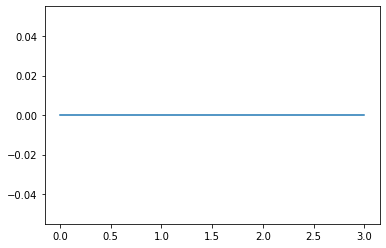

In [ ]:
plt.plot([rf(X_train, y_train, X_test, y_test, max_features='auto', max_depth=i) for i in [80, 100, 120, 200]])


### Optimise for Recall with SMOTE Dataset - VERY LONG , GRID SEARCH COMMENTED OUT

In [ ]:
t0= time.perf_counter()

model = RandomForestClassifier()

grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid, 
                    cv=StratifiedKFold(shuffle=True), 
                    scoring=['recall'],
                    refit='recall',
                    verbose=2,
                    n_jobs=-1)
#grid_result = grid.fit(X_res, y_res)

t1 = time.perf_counter() - t0


# summarize the best score and configuration
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# summarize all scores that were evaluated
#means = grid_result.cv_results_['mean_test_recall']
#stds = grid_result.cv_results_['std_test_recall']
#params = grid_result.cv_results_['params']
#for mean, stdev, param in zip(means, stds, params):
#    print("%f (%f) with: %r" % (mean, stdev, param))

#grid_result.best_estimator_


Best: 0.007407 using {'n_estimators': 200, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 'auto', 'max_depth': 10, 'bootstrap': True}


Result:


```
Fitting 5 folds for each of 384 candidates, totalling 1920 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 361 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 644 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 1009 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 1454 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 1920 out of 1920 | elapsed: 20.8min finished
RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)



Best: 0.917663 using {'bootstrap': True, 'max_depth': 10, 'max_features': 'auto', 'min_samples_leaf': 3, 'min_samples_split': 8, 'n_estimators': 100}

```



In [ ]:
model = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=8,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

model.fit(X_res, y_res)

y_pres = model.predict(X_res)
print( confusion_matrix(y_res, y_pres))
print( recall_score(y_res, y_pres))

y_pred = model.predict(X_test)

print( confusion_matrix(y_test, y_pred))

df_results['RFC SMOTE'] = ['Recall', '',
                          'max_features=' + str(model.max_features), 
                          'min_samples_split=' + str(model.min_samples_split), 
                          'min_samples_leaf=' + str(model.min_samples_leaf),
                          accuracy_score(y_test, y_pred), 
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), 'N\A']

[[1842   89]
 [  87 1844]]
0.9549456240290005
[[457  26]
 [ 26   8]]


In [ ]:
model = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

model.fit(X_res, y_res)

y_pres = model.predict(X_res)
y_pred = model.predict(X_test)
print("Training set Recall score: {}, Test set Recall score: {}".format( recall_score(y_res, y_pres), recall_score(y_test, y_pred)))


print( confusion_matrix(y_test, y_pred))

df_results['RFC SMOTE'] = ['Recall', '',
                          'max_features=' + str(model.max_features), 
                          'min_samples_split=' + str(model.min_samples_split), 
                          'min_samples_leaf=' + str(model.min_samples_leaf),
                          accuracy_score(y_test, y_pred), 
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), 'N\A']

Training set Recall score: 0.949766960124288, Test set Recall score: 0.23529411764705882
[[455  28]
 [ 26   8]]


### Looks like optimised RFC overfitting, try out a smaller max_leaf_nodes

In [ ]:
model = RandomForestClassifier(max_leaf_nodes=10)
model.fit(X_res, y_res)

y_pres = model.predict(X_res)
y_pred = model.predict(X_test)
print("Training set Recall score: {}, Test set Recall score: {}".format( recall_score(y_res, y_pres), recall_score(y_test, y_pred)))

print( confusion_matrix(y_test, y_pred))

df_results['RFC SMOTE max_leaf_nodes=10'] = ['max_depth' + str(model.max_depth),                                   
                          'max_leaf_nodes=' + str(model.max_leaf_nodes),
                          'max_features=' + str(model.max_features), 
                          'min_samples_split=' + str(model.min_samples_split), 
                          'min_samples_leaf=' + str(model.min_samples_leaf),
                          accuracy_score(y_test, y_pred), 
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), 'N\A']


Training set Recall score: 0.8244432936302434, Test set Recall score: 0.6176470588235294
[[413  70]
 [ 13  21]]


In [ ]:
20 / (20 + 14)

0.5882352941176471

In [ ]:
model = RandomForestClassifier(max_depth=3)
model.fit(X_res, y_res)

y_pred = model.predict(X_test)

print( confusion_matrix(y_test, y_pred))

df_results['RFC SMOTE max_depth=3'] = ['max_depth' + str(model.max_depth),                                   
                          'max_leaf_nodes=' + str(model.max_leaf_nodes),
                          'max_features=' + str(model.max_features), 
                          'min_samples_split=' + str(model.min_samples_split), 
                          'min_samples_leaf=' + str(model.min_samples_leaf),
                          accuracy_score(y_test, y_pred), 
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), 'N\A']


[[403  80]
 [ 13  21]]


In [ ]:
df_results.T.to_csv(model_store_location + "FinalResults.csv")
df_results

,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A


### Feature importances

In [ ]:
X_cols

['ghazard_enc_0',
 'nbumps5',
 'scaled_energy',
 'nbumps3',
 'shift_enc_0',
 'nbumps',
 'seismoacoustic_enc_0',
 'nbumps2',
 'seismic_enc_0',
 'scaled_gpuls',
 'scaled_gdenergy',
 'scaled_genergy',
 'nbumps4']

In [ ]:
rfc_fi = pd.DataFrame({'cols':X_cols, 'imp':model.feature_importances_}
                       ).sort_values('imp', ascending=False)
rfc_fi

,cols,imp
5,nbumps,0.252063
4,shift_enc_0,0.176772
2,scaled_energy,0.150509
7,nbumps2,0.144282
11,scaled_genergy,0.098388
9,scaled_gpuls,0.050679
8,seismic_enc_0,0.049373
3,nbumps3,0.028811
6,seismoacoustic_enc_0,0.019038
10,scaled_gdenergy,0.014968


## SVM

In [ ]:
from sklearn.svm import SVC 
model = SVC() 

param_grid = {'C': [0.1, 1, 10, 100, 1000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
              'kernel': [ 'linear', 'poly', 'rbf', 'sigmoid']}


### SVM Optimisation with Raw dataset

Long optimisation, comment out here

In [ ]:
t0= time.perf_counter()

grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid, 
                    cv=StratifiedKFold(shuffle=True), 
                    scoring=['f1'],
                    refit='f1',
                    verbose=1, n_jobs=-1)
#grid_result = grid.fit(X_train, y_train)

t1 = time.perf_counter() - t0

#grid_result.best_estimator_


In [ ]:
# defining parameter range 
small_param_grid = {'C': [1],  
              'gamma': [1], 
              'kernel': ['poly', 'rbf', 'sigmoid']}

t0= time.perf_counter()
grid = GridSearchCV(estimator=model, 
                    param_grid=small_param_grid, 
                    cv=StratifiedKFold(shuffle=True), 
                    scoring=['f1'],
                    refit='f1',
                    verbose=3, n_jobs=-1)
#grid_result = grid.fit(X_train, y_train)

t1 = time.perf_counter() - t0

#grid_result.best_estimator_


Result:

```
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed: 83.6min finished
SVC(C=1, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='poly',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)
```



In [ ]:
model = grid_result.best_estimator_

In [ ]:
file_name = 'seismic_bump_svm_model.sav'
joblib.dump(model, model_store_location + file_name)

['model-store-2020-09-23/seismic_bump_svm_model.sav']

In [ ]:
#grid_result.best_estimator_

In [ ]:
model = SVC(C=1, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='poly',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

model.fit(X_train, y_train)

SVC(C=1, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='poly',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [ ]:
y_pred = model.predict(X_test)
accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred), f1_score(y_test, y_pred)

(0.8955512572533849,
 0.08823529411764706,
 0.11538461538461539,
 0.10000000000000002)

In [ ]:
confusion_matrix(y_test, y_pred)

array([[460,  23],
       [ 31,   3]])

In [ ]:
df_results['SVC Original Dataset'] = ['f1', 'SVM', 'C: {}'.format(model.get_params()['C']), 
                                      'gamma: {}'.format(model.get_params()['gamma']),
                                      'kernel: {}'.format(model.get_params()['kernel']),
                                      accuracy_score(y_test, y_pred), 
                                      precision_score(y_test, y_pred), 
                                      recall_score(y_test, y_pred), 
                                      f1_score(y_test, y_pred), (83*60)]

In [ ]:
df_results

,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980


### SVM Optimisation with SMOTE Augmented dataset - VERY LONG GRIDSEARCH -> COMMENTED OUT , results in

In [ ]:
model = SVC() 

param_grid = {'C': [0.1, 1, 10],  
              'gamma': [1, 0.1, 0.01], 
              'kernel': [ 'linear', 'poly', 'rbf', 'sigmoid']}


In [ ]:
# defining parameter range 
t0= time.perf_counter()

grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid, 
                    cv=StratifiedKFold(shuffle=True), 
                    scoring=['recall'],
                    refit='recall',
                    verbose=2, n_jobs=-1)
#grid_result = grid.fit(X_res, y_res)

t1 = time.perf_counter() - t0


# summarize the best score and configuration
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# summarize all scores that were evaluated
#means = grid_result.cv_results_['mean_test_score']
#stds = grid_result.cv_results_['std_test_score']
#params = grid_result.cv_results_['params']
#for mean, stdev, param in zip(means, stds, params):
#    print("%f (%f) with: %r" % (mean, stdev, param))

#grid_result.best_estimator_


Best: 0.007407 using {'n_estimators': 200, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 'auto', 'max_depth': 10, 'bootstrap': True}


Results:


```

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed: 104.3min
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed: 614.2min
[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed: 615.1min finished
Best: 0.973589 using {'C': 10, 'gamma': 1, 'kernel': 'rbf'}

```



In [ ]:
model = SVC(C=10, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='rbf', max_iter=-1,
    probability=False, random_state=None, shrinking=True, tol=0.001,
    verbose=True)
model.fit(X_res, y_res)

y_pred = model.predict(X_test)
print(confusion_matrix(y_test, y_pred))

y_pres = model.predict(X_res)
print(confusion_matrix(y_res, y_pres))

df_results['SVC SMOTE'] = ['[recall]', 'SVM', 'C: {}'.format(model.get_params()['C']), 
                           'gamma: {}'.format(model.get_params()['gamma']),
                           'kernel: {}'.format(model.get_params()['kernel']),
                          accuracy_score(y_test, y_pred), 
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), (530*60)]

df_results

[LibSVM][[460  23]
 [ 31   3]]
[[1887   44]
 [  32 1899]]


,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall]
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800


# Decision Tree

Optimisation with Raw dataset

In [ ]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz

t0= time.perf_counter()

DT_classifier = DecisionTreeClassifier()
DTree = DT_classifier.fit(X_train, y_train)

t1 = time.perf_counter() - t0


In [ ]:
predictedDT = DT_classifier.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

DT_result = accuracy_score(y_test, predictedDT) * 100
print("Accuracy score using DecisionTreeClassifier:", DT_result)
print(confusion_matrix(y_test, predictedDT))
print(classification_report(y_test, predictedDT))

Accuracy score using DecisionTreeClassifier: 87.62088974854933
[[448  35]
 [ 29   5]]
              precision    recall  f1-score   support

           0       0.94      0.93      0.93       483
           1       0.12      0.15      0.14        34

    accuracy                           0.88       517
   macro avg       0.53      0.54      0.53       517
weighted avg       0.89      0.88      0.88       517



In [ ]:
df_results['Decision Tree Raw Data'] = ['None', '',
                          'max_features=' + str(DT_classifier.max_features), 
                          'min_samples_split=' + str(DT_classifier.min_samples_split), 
                          'min_samples_leaf=' + str(DT_classifier.min_samples_leaf),
                          accuracy_score(y_test, predictedDT),
                          precision_score(y_test, predictedDT), 
                          recall_score(y_test, predictedDT), 
                          f1_score(y_test, predictedDT), t1]

df_results

,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE,Decision Tree Raw Data
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall],None
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM,
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10,max_features=None
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1,min_samples_split=2
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf,min_samples_leaf=1
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551,0.876209
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385,0.125
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353,0.147059
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1,0.135135
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800,0.0143595


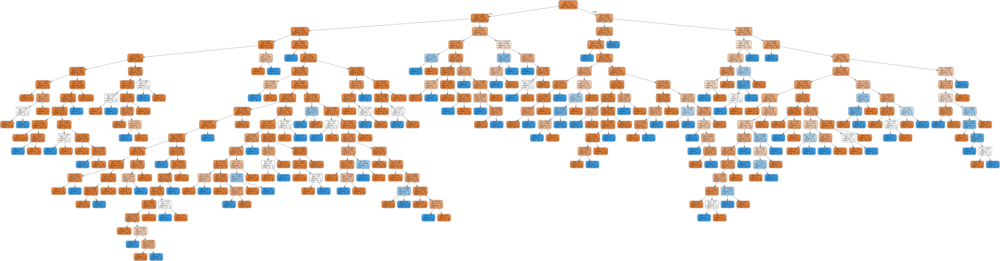

In [ ]:
from sklearn.externals.six import StringIO
from IPython.display import Image 
import pydotplus

# visualizing data 
dot_data = StringIO()

export_graphviz(
    DTree,
    out_file = dot_data,
    rounded = True, 
    special_characters = True,
    filled = True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

Optimisation with SMOTE Augmented dataset 

In [ ]:
t0= time.perf_counter()

DTreeSM = DT_classifier.fit(X_res, y_res)

t1 = time.perf_counter() - t0


In [ ]:
predictedDTSM = DT_classifier.predict(X_test)

In [ ]:
SmoteDT = accuracy_score(y_test, predictedDTSM) * 100
print("Accuracy score using DecisionTreeClassifier:", SmoteDT)
print(confusion_matrix(y_test, predictedDTSM))
print(classification_report(y_test, predictedDTSM))

Accuracy score using DecisionTreeClassifier: 88.58800773694391
[[452  31]
 [ 28   6]]
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       483
           1       0.16      0.18      0.17        34

    accuracy                           0.89       517
   macro avg       0.55      0.56      0.55       517
weighted avg       0.89      0.89      0.89       517



In [ ]:
df_results['Decision Tree SMOTE Data'] = ['None', '',
                          'max_features=' + str(DTreeSM.max_features), 
                          'min_samples_split=' + str(DTreeSM.min_samples_split), 
                          'min_samples_leaf=' + str(DTreeSM.min_samples_leaf),
                          accuracy_score(y_test, predictedDTSM),
                          precision_score(y_test, predictedDTSM), 
                          recall_score(y_test, predictedDTSM), 
                          f1_score(y_test, predictedDTSM), t1]

df_results

,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE,Decision Tree Raw Data,Decision Tree SMOTE Data
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall],None,None
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM,,
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10,max_features=None,max_features=None
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1,min_samples_split=2,min_samples_split=2
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf,min_samples_leaf=1,min_samples_leaf=1
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551,0.876209,0.88588
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385,0.125,0.162162
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353,0.147059,0.176471
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1,0.135135,0.169014
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800,0.0143595,0.0294407


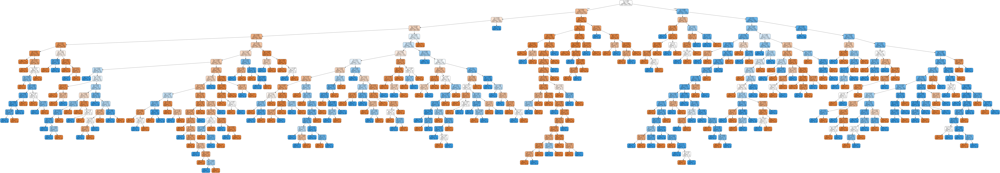

In [ ]:
# visualizing data 
dot_data = StringIO()

export_graphviz(
    DTreeSM,
    out_file = dot_data,
    rounded = True, 
    special_characters = True,
    filled = True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

### max_leaf_nodes=10 for Visualisation and to avoid overfitting

In [ ]:
t0= time.perf_counter()

DTM_classifier = DecisionTreeClassifier(max_leaf_nodes=10)
DTreeSM = DTM_classifier.fit(X_res, y_res)

t1 = time.perf_counter() - t0

predictedDTSM = DTM_classifier.predict(X_test)

df_results['DecisionTree SMOTE max_leaf_nodes=10'] = ['None', '',
                          'max_features=' + str(DTreeSM.max_features), 
                          'min_samples_split=' + str(DTreeSM.min_samples_split), 
                          'min_samples_leaf=' + str(DTreeSM.min_samples_leaf),
                          accuracy_score(y_test, predictedDTSM),
                          precision_score(y_test, predictedDTSM), 
                          recall_score(y_test, predictedDTSM), 
                          f1_score(y_test, predictedDTSM), t1]

df_results

,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE,Decision Tree Raw Data,Decision Tree SMOTE Data,DecisionTree SMOTE max_leaf_nodes=10
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall],None,None,None
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM,,,
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10,max_features=None,max_features=None,max_features=None
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1,min_samples_split=2,min_samples_split=2,min_samples_split=2
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551,0.876209,0.88588,0.715667
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385,0.125,0.162162,0.135484
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353,0.147059,0.176471,0.617647
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1,0.135135,0.169014,0.222222
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800,0.0143595,0.0294407,0.0179622


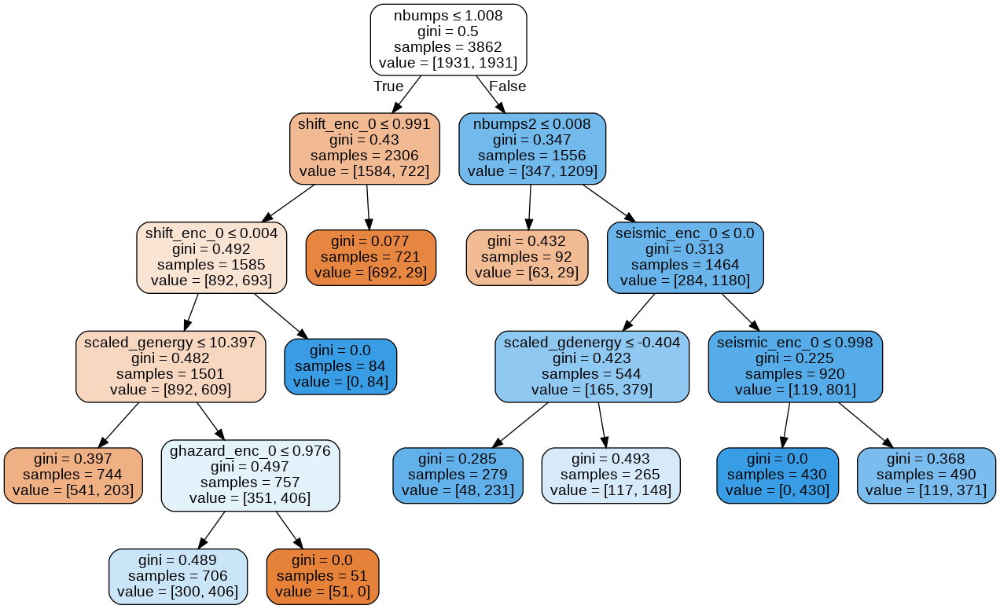

In [ ]:
# visualizing data 
dot_data = StringIO()

export_graphviz(
    DTreeSM,
    out_file = dot_data,
    feature_names=X_cols,
    rounded = True, 
    special_characters = True,
    filled = True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

Diagram shows 0 and 1 values

In [ ]:
Counter( y_res[(X_res.nbumps > 1.0) & (X_res.seismic_enc_0 <= 0.001)])


Counter({0: 200, 1: 384})

In [ ]:
Counter(y_res)

Counter({0: 1931, 1: 1931})

In [ ]:
t0= time.perf_counter()

DTM_classifier = DecisionTreeClassifier(max_depth=3)
DTreeSM = DTM_classifier.fit(X_res, y_res)

t1 = time.perf_counter() - t0

predictedDTSM = DTM_classifier.predict(X_test)

df_results['DecisionTree SMOTE max_depth=3'] = ['None', '',
                          'max_features=' + str(DTreeSM.max_features), 
                          'min_samples_split=' + str(DTreeSM.min_samples_split), 
                          'min_samples_leaf=' + str(DTreeSM.min_samples_leaf),
                          accuracy_score(y_test, predictedDTSM),
                          precision_score(y_test, predictedDTSM), 
                          recall_score(y_test, predictedDTSM), 
                          f1_score(y_test, predictedDTSM), t1]

df_results

,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE,Decision Tree Raw Data,Decision Tree SMOTE Data,DecisionTree SMOTE max_leaf_nodes=10,DecisionTree SMOTE max_depth=3
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall],None,None,None,None
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM,,,,
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10,max_features=None,max_features=None,max_features=None,max_features=None
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551,0.876209,0.88588,0.715667,0.860735
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385,0.125,0.162162,0.135484,0.236111
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353,0.147059,0.176471,0.617647,0.5
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1,0.135135,0.169014,0.222222,0.320755
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800,0.0143595,0.0294407,0.0179622,0.0268361


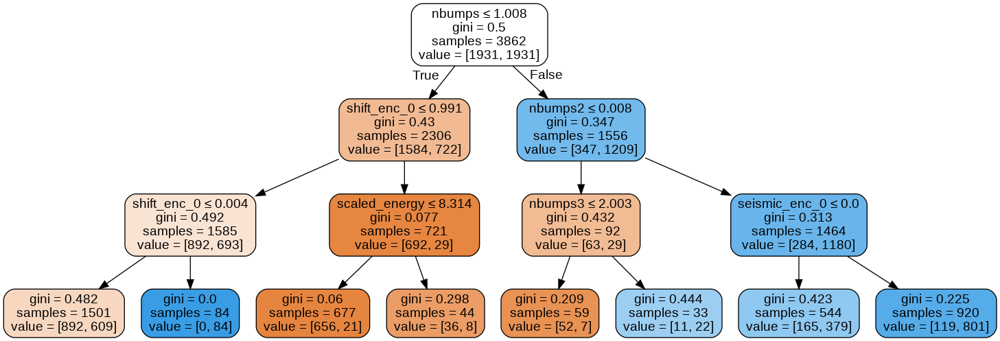

In [ ]:
# visualizing data 
dot_data = StringIO()

export_graphviz(
    DTreeSM,
    out_file = dot_data,
    feature_names=X_cols,
    rounded = True, 
    special_characters = True,
    filled = True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

### Bit strange that Shift type is so predictive, could be because of correlations with nbump, nbump2.. or Leakage? Try and remove it from features.

In [ ]:
X_reduced_res = X_res.drop('shift_enc_0', axis=1)
X_reduced_test = X_test.drop('shift_enc_0', axis=1)

In [ ]:
t0= time.perf_counter()

DTM_classifier = DecisionTreeClassifier(max_leaf_nodes=10)
DTreeSM = DTM_classifier.fit(X_reduced_res, y_res)

t1 = time.perf_counter() - t0

predictedDTSM = DTM_classifier.predict(X_reduced_test)

df_results['DecisionTree SMOTE-shift max_leaf_nodes=10'] = ['None', '',
                          'max_features=' + str(DTreeSM.max_features), 
                          'min_samples_split=' + str(DTreeSM.min_samples_split), 
                          'min_samples_leaf=' + str(DTreeSM.min_samples_leaf),
                          accuracy_score(y_test, predictedDTSM),
                          precision_score(y_test, predictedDTSM), 
                          recall_score(y_test, predictedDTSM), 
                          f1_score(y_test, predictedDTSM), t1]

df_results

,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE,Decision Tree Raw Data,Decision Tree SMOTE Data,DecisionTree SMOTE max_leaf_nodes=10,DecisionTree SMOTE max_depth=3,DecisionTree SMOTE-shift max_leaf_nodes=10
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall],None,None,None,None,None
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM,,,,,
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10,max_features=None,max_features=None,max_features=None,max_features=None,max_features=None
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551,0.876209,0.88588,0.715667,0.860735,0.847195
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385,0.125,0.162162,0.135484,0.236111,0.222222
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353,0.147059,0.176471,0.617647,0.5,0.529412
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1,0.135135,0.169014,0.222222,0.320755,0.313043
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800,0.0143595,0.0294407,0.0179622,0.0268361,0.0171248


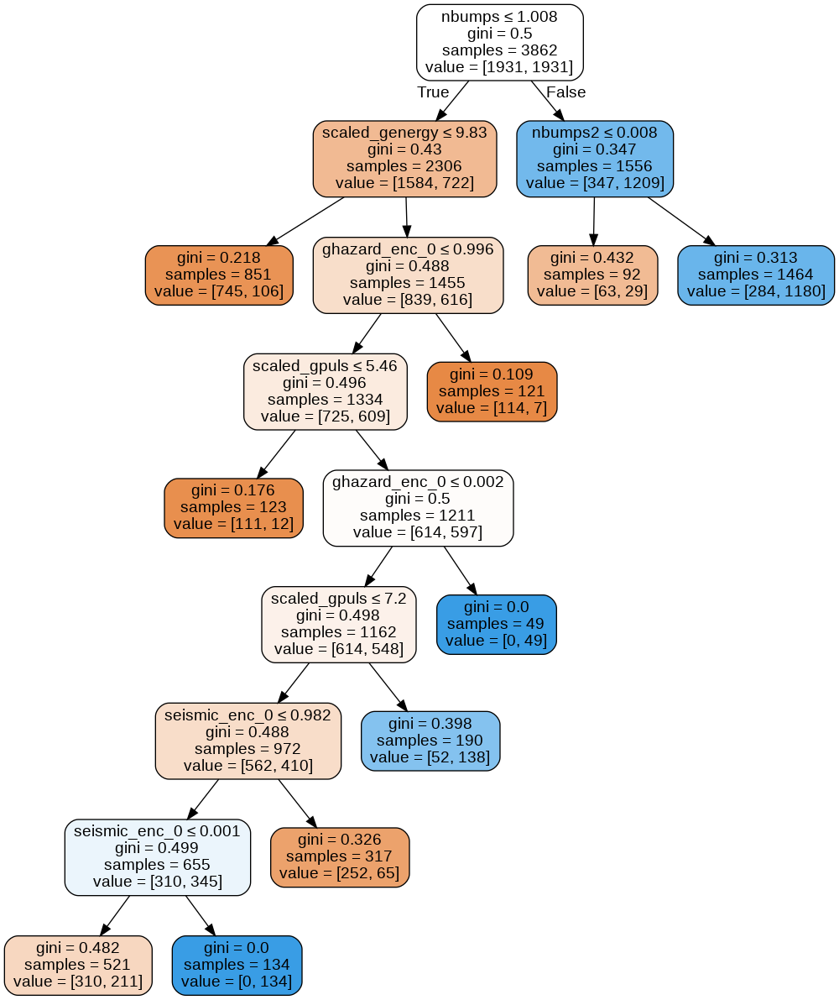

In [ ]:
X_red_cols = list(set(X_cols) - set(['shift_enc_0']))
# visualizing data 
dot_data = StringIO()

export_graphviz(
    DTreeSM,
    out_file = dot_data,
    feature_names=X_red_cols,
    rounded = True, 
    special_characters = True,
    filled = True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [ ]:
cm = confusion_matrix(y_test, predictedDTSM)
cm

array([[420,  63],
       [ 16,  18]])

In [ ]:
precision_class1 = cm[1, 1] / (cm[0, 1] + cm[1, 1])
recall_class1 = cm[1, 1] / (cm[1, 0] + cm[1, 1])
precision_class1, recall_class1

(0.2222222222222222, 0.5294117647058824)

In [ ]:
precision_class2 = cm[0, 0] / (cm[1, 0] + cm[0, 0])
recall_class2 = cm[0, 0] / (cm[0, 1] + cm[0, 0])
precision_class2, recall_class2

(0.963302752293578, 0.8695652173913043)

In [ ]:
df_results.T.to_csv(model_store_location + "FinalResults.csv")

# AdaBoost

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import AdaBoostClassifier


clf = AdaBoostClassifier(n_estimators=100, learning_rate=1.0, random_state=0)
scores = cross_val_score(clf, X_train, y_train, scoring='f1', cv=skf, n_jobs=-1, error_score='raise')
scores.mean(), scores.std()

(0.09418067226890756, 0.05932988843174537)

### AdaBoost Baseline

In [ ]:
t0= time.perf_counter()

clf.fit(X_train, y_train)

t1 = time.perf_counter() - t0

y_pred = clf.predict(X_test)

print(confusion_matrix(y_test, y_pred))

df_results['AdaBoost Raw data'] = ['None', str(clf.algorithm),
                          'learning_rate=' + str(clf.learning_rate), 
                          'n_estimators=' + str(clf.n_estimators), 
                          '',
                          accuracy_score(y_test, y_pred),
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), t1]

df_results

[[478   5]
 [ 33   1]]


,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE,Decision Tree Raw Data,Decision Tree SMOTE Data,DecisionTree SMOTE max_leaf_nodes=10,DecisionTree SMOTE max_depth=3,DecisionTree SMOTE-shift max_leaf_nodes=10,AdaBoost Raw data
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall],None,None,None,None,None,None
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM,,,,,,SAMME.R
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10,max_features=None,max_features=None,max_features=None,max_features=None,max_features=None,learning_rate=1.0
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,n_estimators=100
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551,0.876209,0.88588,0.715667,0.860735,0.847195,0.926499
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385,0.125,0.162162,0.135484,0.236111,0.222222,0.166667
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353,0.147059,0.176471,0.617647,0.5,0.529412,0.0294118
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1,0.135135,0.169014,0.222222,0.320755,0.313043,0.05
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800,0.0143595,0.0294407,0.0179622,0.0268361,0.0171248,0.358785


In [ ]:
t0= time.perf_counter()

clf.fit(X_res, y_res)

t1 = time.perf_counter() - t0

y_pred = clf.predict(X_test)

print(confusion_matrix(y_test, y_pred))

df_results['AdaBoost SMOTE data'] = ['None', str(clf.algorithm),
                          'learning_rate=' + str(clf.learning_rate), 
                          'n_estimators=' + str(clf.n_estimators), 
                          '',
                          accuracy_score(y_test, y_pred),
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), t1]

df_results

[[448  35]
 [ 23  11]]


,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE,Decision Tree Raw Data,Decision Tree SMOTE Data,DecisionTree SMOTE max_leaf_nodes=10,DecisionTree SMOTE max_depth=3,DecisionTree SMOTE-shift max_leaf_nodes=10,AdaBoost Raw data,AdaBoost SMOTE data
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall],None,None,None,None,None,None,None
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM,,,,,,SAMME.R,SAMME.R
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10,max_features=None,max_features=None,max_features=None,max_features=None,max_features=None,learning_rate=1.0,learning_rate=1.0
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,n_estimators=100,n_estimators=100
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,,
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551,0.876209,0.88588,0.715667,0.860735,0.847195,0.926499,0.887814
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385,0.125,0.162162,0.135484,0.236111,0.222222,0.166667,0.23913
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353,0.147059,0.176471,0.617647,0.5,0.529412,0.0294118,0.323529
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1,0.135135,0.169014,0.222222,0.320755,0.313043,0.05,0.275
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800,0.0143595,0.0294407,0.0179622,0.0268361,0.0171248,0.358785,0.529944


### AdaBoost SMOTE  DTD_Max_Depth=3

In [ ]:
clf = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3) , 
                         n_estimators=100, learning_rate=0.1, random_state=0)


t0= time.perf_counter()

clf.fit(X_res, y_res)

t1 = time.perf_counter() - t0

y_pred = clf.predict(X_test)

print(confusion_matrix(y_test, y_pred))

df_results['AdaBoost SMOTE DTD_Max_Depth=3'] = ['None', str(clf.algorithm),
                          'learning_rate=' + str(clf.learning_rate), 
                          'n_estimators=' + str(clf.n_estimators), 
                          '',
                          accuracy_score(y_test, y_pred),
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), t1]

df_results


[[466  17]
 [ 26   8]]


,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE,Decision Tree Raw Data,Decision Tree SMOTE Data,DecisionTree SMOTE max_leaf_nodes=10,DecisionTree SMOTE max_depth=3,DecisionTree SMOTE-shift max_leaf_nodes=10,AdaBoost Raw data,AdaBoost SMOTE data,AdaBoost SMOTE DTD_Max_Depth=3
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall],None,None,None,None,None,None,None,None
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM,,,,,,SAMME.R,SAMME.R,SAMME.R
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10,max_features=None,max_features=None,max_features=None,max_features=None,max_features=None,learning_rate=1.0,learning_rate=1.0,learning_rate=0.1
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,n_estimators=100,n_estimators=100,n_estimators=100
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,,,
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551,0.876209,0.88588,0.715667,0.860735,0.847195,0.926499,0.887814,0.916828
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385,0.125,0.162162,0.135484,0.236111,0.222222,0.166667,0.23913,0.32
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353,0.147059,0.176471,0.617647,0.5,0.529412,0.0294118,0.323529,0.235294
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1,0.135135,0.169014,0.222222,0.320755,0.313043,0.05,0.275,0.271186
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800,0.0143595,0.0294407,0.0179622,0.0268361,0.0171248,0.358785,0.529944,1.03782


### AdaBoost SMOTE Finetune

In [ ]:

# define the model with default hyperparameters
model = AdaBoostClassifier()

# define the grid of values to search
grid = dict()
grid['n_estimators'] = [10, 50, 100, 500]
grid['learning_rate'] = [0.0001, 0.001, 0.01, 0.1, 1.0]
skf = StratifiedKFold(n_splits=5)

t0= time.perf_counter()

# define the grid search procedure
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=skf, scoring='recall')
# execute the grid search
grid_result = grid_search.fit(X_res, y_res)

t1 = time.perf_counter() - t0


# summarize the best score and configuration
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# summarize all scores that were evaluated
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.854983 using {'learning_rate': 1.0, 'n_estimators': 100}
0.625572 (0.029326) with: {'learning_rate': 0.0001, 'n_estimators': 10}
0.625572 (0.029326) with: {'learning_rate': 0.0001, 'n_estimators': 50}
0.625572 (0.029326) with: {'learning_rate': 0.0001, 'n_estimators': 100}
0.625572 (0.029326) with: {'learning_rate': 0.0001, 'n_estimators': 500}
0.625572 (0.029326) with: {'learning_rate': 0.001, 'n_estimators': 10}
0.625572 (0.029326) with: {'learning_rate': 0.001, 'n_estimators': 50}
0.621427 (0.030597) with: {'learning_rate': 0.001, 'n_estimators': 100}
0.620910 (0.030196) with: {'learning_rate': 0.001, 'n_estimators': 500}
0.621427 (0.030597) with: {'learning_rate': 0.01, 'n_estimators': 10}
0.620910 (0.030196) with: {'learning_rate': 0.01, 'n_estimators': 50}
0.639045 (0.021746) with: {'learning_rate': 0.01, 'n_estimators': 100}
0.801134 (0.051191) with: {'learning_rate': 0.01, 'n_estimators': 500}
0.628164 (0.037886) with: {'learning_rate': 0.1, 'n_estimators': 10}
0.798555

In [ ]:
y_pred = grid_result.best_estimator_.predict(X_res)
print(confusion_matrix(y_res, y_pred))
print(recall_score(y_res, y_pred, pos_label=1))

[[1781  150]
 [ 260 1671]]
0.8653547384774728


In [ ]:
clf = AdaBoostClassifier(n_estimators=500, learning_rate=1.0)

clf.fit(X_res, y_res)

y_pred = clf.predict(X_test)

print(confusion_matrix(y_test, y_pred))

df_results['AdaBoost SMOTE finetuned'] = ['f1', str(clf.algorithm),
                          'learning_rate=' + str(clf.learning_rate), 
                          'n_estimators=' + str(clf.n_estimators), 
                          '',
                          accuracy_score(y_test, y_pred),
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), t1]

df_results

[[450  33]
 [ 28   6]]


,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE,Decision Tree Raw Data,Decision Tree SMOTE Data,DecisionTree SMOTE max_leaf_nodes=10,DecisionTree SMOTE max_depth=3,DecisionTree SMOTE-shift max_leaf_nodes=10,AdaBoost Raw data,AdaBoost SMOTE data,AdaBoost SMOTE DTD_Max_Depth=3,AdaBoost SMOTE finetuned
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall],None,None,None,None,None,None,None,None,f1
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM,,,,,,SAMME.R,SAMME.R,SAMME.R,SAMME.R
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10,max_features=None,max_features=None,max_features=None,max_features=None,max_features=None,learning_rate=1.0,learning_rate=1.0,learning_rate=0.1,learning_rate=1.0
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,n_estimators=100,n_estimators=100,n_estimators=100,n_estimators=500
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,,,,
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551,0.876209,0.88588,0.715667,0.860735,0.847195,0.926499,0.887814,0.916828,0.882012
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385,0.125,0.162162,0.135484,0.236111,0.222222,0.166667,0.23913,0.32,0.153846
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353,0.147059,0.176471,0.617647,0.5,0.529412,0.0294118,0.323529,0.235294,0.176471
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1,0.135135,0.169014,0.222222,0.320755,0.313043,0.05,0.275,0.271186,0.164384
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800,0.0143595,0.0294407,0.0179622,0.0268361,0.0171248,0.358785,0.529944,1.03782,62.4149


# XGBoost

## XGBoost model with raw data

In [ ]:
xgb_model = XGBClassifier(n_estimators=1000, learning_rate=0.05)
t0= time.perf_counter()

xgb_model.fit(X_train, y_train, 
             early_stopping_rounds=5, # stop overfitting
             eval_set=[(X_test, y_test)], 
             verbose=False)

t1 = time.perf_counter() - t0


In [ ]:
y_pred = xgb_model.predict(X_test)


In [ ]:
print(confusion_matrix(y_test, y_pred))

df_results['XGBoost'] = ['[Baseline]', 'XGBoost', '', '', '',
                          accuracy_score(y_test, y_pred), 
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), t1]

df_results

[[483   0]
 [ 34   0]]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE,Decision Tree Raw Data,Decision Tree SMOTE Data,DecisionTree SMOTE max_leaf_nodes=10,DecisionTree SMOTE max_depth=3,DecisionTree SMOTE-shift max_leaf_nodes=10,AdaBoost Raw data,AdaBoost SMOTE data,AdaBoost SMOTE DTD_Max_Depth=3,AdaBoost SMOTE finetuned,XGBoost
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall],None,None,None,None,None,None,None,None,f1,[Baseline]
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM,,,,,,SAMME.R,SAMME.R,SAMME.R,SAMME.R,XGBoost
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10,max_features=None,max_features=None,max_features=None,max_features=None,max_features=None,learning_rate=1.0,learning_rate=1.0,learning_rate=0.1,learning_rate=1.0,
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,n_estimators=100,n_estimators=100,n_estimators=100,n_estimators=500,
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,,,,,
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551,0.876209,0.88588,0.715667,0.860735,0.847195,0.926499,0.887814,0.916828,0.882012,0.934236
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385,0.125,0.162162,0.135484,0.236111,0.222222,0.166667,0.23913,0.32,0.153846,0
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353,0.147059,0.176471,0.617647,0.5,0.529412,0.0294118,0.323529,0.235294,0.176471,0
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1,0.135135,0.169014,0.222222,0.320755,0.313043,0.05,0.275,0.271186,0.164384,0
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800,0.0143595,0.0294407,0.0179622,0.0268361,0.0171248,0.358785,0.529944,1.03782,62.4149,0.139584


## XGBoost model with SMOTE data

In [ ]:
xgb_model = XGBClassifier(n_estimators=1000, learning_rate=0.05)

# split SMOTE Data for Training and Eval set
train_X_res, val_X_res, train_y_res, val_y_res = train_test_split(X_res, y_res, random_state = 0)
t0= time.perf_counter()

xgb_model.fit(train_X_res, train_y_res, 
             early_stopping_rounds=5, # stop overfitting
             eval_set=[(val_X_res, val_y_res)], 
             verbose=False)

t1 = time.perf_counter() - t0


y_pred = xgb_model.predict(X_test)

print(confusion_matrix(y_test, y_pred))

df_results['XGBoost SMOTE'] = ['[Baseline]', 'XGBoost SMOTE', '', '', '',
                          accuracy_score(y_test, y_pred), 
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), t1]

df_results

[[428  55]
 [ 17  17]]


,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE,Decision Tree Raw Data,Decision Tree SMOTE Data,DecisionTree SMOTE max_leaf_nodes=10,DecisionTree SMOTE max_depth=3,DecisionTree SMOTE-shift max_leaf_nodes=10,AdaBoost Raw data,AdaBoost SMOTE data,AdaBoost SMOTE DTD_Max_Depth=3,AdaBoost SMOTE finetuned,XGBoost,XGBoost SMOTE
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall],None,None,None,None,None,None,None,None,f1,[Baseline],[Baseline]
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM,,,,,,SAMME.R,SAMME.R,SAMME.R,SAMME.R,XGBoost,XGBoost SMOTE
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10,max_features=None,max_features=None,max_features=None,max_features=None,max_features=None,learning_rate=1.0,learning_rate=1.0,learning_rate=0.1,learning_rate=1.0,,
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,n_estimators=100,n_estimators=100,n_estimators=100,n_estimators=500,,
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,,,,,,
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551,0.876209,0.88588,0.715667,0.860735,0.847195,0.926499,0.887814,0.916828,0.882012,0.934236,0.860735
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385,0.125,0.162162,0.135484,0.236111,0.222222,0.166667,0.23913,0.32,0.153846,0,0.236111
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353,0.147059,0.176471,0.617647,0.5,0.529412,0.0294118,0.323529,0.235294,0.176471,0,0.5
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1,0.135135,0.169014,0.222222,0.320755,0.313043,0.05,0.275,0.271186,0.164384,0,0.320755
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800,0.0143595,0.0294407,0.0179622,0.0268361,0.0171248,0.358785,0.529944,1.03782,62.4149,0.139584,0.036193


In [ ]:
 16 / (16 +18)

0.47058823529411764

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2

In [ ]:



# Define our search space for grid search
search_space = [
  {
    'clf__n_estimators': [50, 100, 150, 200],
    'clf__learning_rate': [0.01, 0.1, 0.2, 0.3],
    'clf__max_depth': range(3, 10),
    'clf__colsample_bytree': [i/10.0 for i in range(1, 3)],
    'clf__gamma': [i/10.0 for i in range(3)],
    'fs__score_func': [chi2],
    'fs__k': [10],
  }
]

small_earch_space = [
  {
    'clf__n_estimators': [50, 100],
    'clf__learning_rate': [0.01, 0.1],
    'clf__max_depth': range(3, 10),
    'clf__colsample_bytree': [i/10.0 for i in range(1, 2)],
    'clf__gamma': [i/10.0 for i in range(2)],
    'fs__score_func': [chi2],
    'fs__k': [10],
  }
]
# Define cross validation
kfold = KFold(n_splits=10, random_state=42)

# Define grid search
grid = GridSearchCV(
  xgb_model,
  param_grid=search_space,
  cv=kfold,
  scoring=['recall'],
  refit='recall',
  verbose=1,
  n_jobs=-1
)
t0= time.perf_counter()

# Fit grid search
#grid_result = grid.fit(X_res, y_res)

t1 = time.perf_counter() - t0

#grid_result.best_estimator_


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


### LONG Optimisation, result here:

```
Fitting 10 folds for each of 672 candidates, totalling 6720 fits
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed: 26.6min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed: 41.8min
[Parallel(n_jobs=-1)]: Done 1796 tasks      | elapsed: 60.3min
[Parallel(n_jobs=-1)]: Done 2446 tasks      | elapsed: 82.0min
[Parallel(n_jobs=-1)]: Done 3196 tasks      | elapsed: 107.3min
[Parallel(n_jobs=-1)]: Done 4046 tasks      | elapsed: 135.7min
[Parallel(n_jobs=-1)]: Done 4996 tasks      | elapsed: 167.6min
[Parallel(n_jobs=-1)]: Done 6046 tasks      | elapsed: 202.9min
[Parallel(n_jobs=-1)]: Done 6720 out of 6720 | elapsed: 225.8min finished
XGBClassifier(base_score=0.5, booster='gbtree', clf__colsample_bytree=0.1,
              clf__gamma=0.0, clf__learning_rate=0.01, clf__max_depth=3,
              clf__n_estimators=50, colsample_bylevel=1, colsample_bynode=1,
              colsample_bytree=1, fs__k=10,
              fs__score_func=<function chi2 at 0x7faea0c6eb70>, gamma=0,
              learning_rate=0.05, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=1000, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)```



In [ ]:
xgb_model = XGBClassifier(base_score=0.5, booster='gbtree', clf__colsample_bytree=0.1,
              clf__gamma=0.0, clf__learning_rate=0.01, clf__max_depth=3,
              clf__n_estimators=50, colsample_bylevel=1, colsample_bynode=1,
              colsample_bytree=1, fs__k=10,
              fs__score_func=chi2, gamma=0,
              learning_rate=0.05, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=1000, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)


xgb_model.fit(train_X_res, train_y_res, 
             early_stopping_rounds=5, # stop overfitting
             eval_set=[(val_X_res, val_y_res)], 
             verbose=False)

y_pred = xgb_model.predict(X_test)

print(confusion_matrix(y_test, y_pred))

df_results['XGBoost SMOTE recall'] = ['[recall]', 'XGBoost SMOTE', '', '', '',
                          accuracy_score(y_test, y_pred), 
                          precision_score(y_test, y_pred), 
                          recall_score(y_test, y_pred), 
                          f1_score(y_test, y_pred), (225*60)]

df_results

[[428  55]
 [ 17  17]]


,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE,Decision Tree Raw Data,Decision Tree SMOTE Data,DecisionTree SMOTE max_leaf_nodes=10,DecisionTree SMOTE max_depth=3,DecisionTree SMOTE-shift max_leaf_nodes=10,AdaBoost Raw data,AdaBoost SMOTE data,AdaBoost SMOTE DTD_Max_Depth=3,AdaBoost SMOTE finetuned,XGBoost,XGBoost SMOTE,XGBoost SMOTE recall
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall],None,None,None,None,None,None,None,None,f1,[Baseline],[Baseline],[recall]
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM,,,,,,SAMME.R,SAMME.R,SAMME.R,SAMME.R,XGBoost,XGBoost SMOTE,XGBoost SMOTE
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10,max_features=None,max_features=None,max_features=None,max_features=None,max_features=None,learning_rate=1.0,learning_rate=1.0,learning_rate=0.1,learning_rate=1.0,,,
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,n_estimators=100,n_estimators=100,n_estimators=100,n_estimators=500,,,
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,,,,,,,
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551,0.876209,0.88588,0.715667,0.860735,0.847195,0.926499,0.887814,0.916828,0.882012,0.934236,0.860735,0.860735
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385,0.125,0.162162,0.135484,0.236111,0.222222,0.166667,0.23913,0.32,0.153846,0,0.236111,0.236111
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353,0.147059,0.176471,0.617647,0.5,0.529412,0.0294118,0.323529,0.235294,0.176471,0,0.5,0.5
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1,0.135135,0.169014,0.222222,0.320755,0.313043,0.05,0.275,0.271186,0.164384,0,0.320755,0.320755
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800,0.0143595,0.0294407,0.0179622,0.0268361,0.0171248,0.358785,0.529944,1.03782,62.4149,0.139584,0.036193,13500


## Features importance: compare XGBoost and RFC

In [ ]:
xgb_model.feature_importances_

xgb_fi = pd.DataFrame({'cols':X_cols, 'imp':xgb_model.feature_importances_}
                       ).sort_values('imp', ascending=False)

xgb_fi["model"]="XGBoost"                       
xgb_fi

,cols,imp,model
5,nbumps,0.530172,XGBoost
4,shift_enc_0,0.202048,XGBoost
7,nbumps2,0.068239,XGBoost
0,ghazard_enc_0,0.067801,XGBoost
11,scaled_genergy,0.064542,XGBoost
8,seismic_enc_0,0.025638,XGBoost
9,scaled_gpuls,0.024363,XGBoost
3,nbumps3,0.014893,XGBoost
2,scaled_energy,0.002304,XGBoost
1,nbumps5,0.000000,XGBoost


In [ ]:
rfc_fi["model"]="Random Forest"

In [ ]:
fi = rfc_fi.append(xgb_fi)
fi

,cols,imp,model
5,nbumps,0.252063,Random Forest
4,shift_enc_0,0.176772,Random Forest
2,scaled_energy,0.150509,Random Forest
7,nbumps2,0.144282,Random Forest
11,scaled_genergy,0.098388,Random Forest
9,scaled_gpuls,0.050679,Random Forest
8,seismic_enc_0,0.049373,Random Forest
3,nbumps3,0.028811,Random Forest
6,seismoacoustic_enc_0,0.019038,Random Forest
10,scaled_gdenergy,0.014968,Random Forest


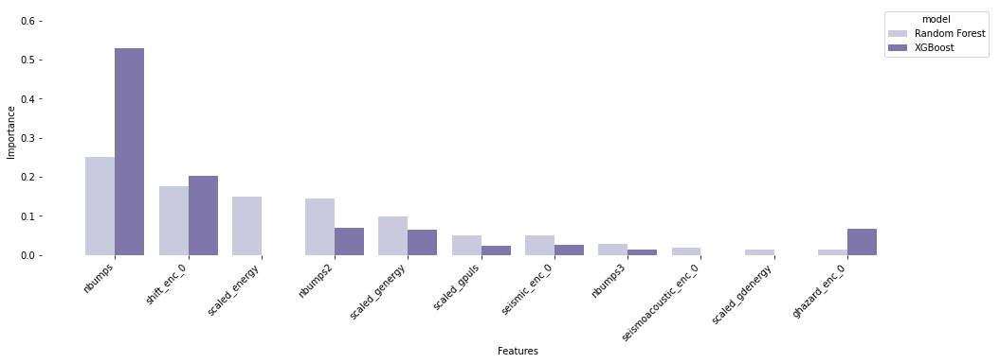

In [ ]:
f, ax = plt.subplots(figsize=(18, 5))

chart = sns.barplot(x="cols", y="imp", data=(fi.loc[fi.imp > 0.01]), hue="model", palette="Purples")

# Add a legend and informative axis label
#ax.legend(ncol=2, loc="best", frameon=True)
ax.set(xlim=(-1, 12), ylabel="Importance",
       xlabel="Features")
sns.despine(left=True, bottom=True)
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')

# You can specify a rotation for the tick labels in degrees or with keywords.
#plt.xticks(fi["cols"], rotation='vertical')
# Pad margins so that markers don't get clipped by the axes
plt.margins(0.2)
# Tweak spacing to prevent clipping of tick-labels
plt.subplots_adjust(bottom=0.15)
plt.show()

# Final results

In [ ]:

df_results.T.to_csv(model_store_location + "FinalResults.csv")

In [ ]:

df_results

,KNC Baseline,KNC Model 1,KNC Model 2,KNC Model 3,KNC Model 4,KNC Model 5,KNC SMOTE 1,KNC Optimised SMOTE,RFC SMOTE,RFC SMOTE max_leaf_nodes=10,RFC SMOTE max_depth=3,SVC Original Dataset,SVC SMOTE,Decision Tree Raw Data,Decision Tree SMOTE Data,DecisionTree SMOTE max_leaf_nodes=10,DecisionTree SMOTE max_depth=3,DecisionTree SMOTE-shift max_leaf_nodes=10,AdaBoost Raw data,AdaBoost SMOTE data,AdaBoost SMOTE DTD_Max_Depth=3,AdaBoost SMOTE finetuned,XGBoost,XGBoost SMOTE,XGBoost SMOTE recall
scoring_technique,None,[precision],[precision],[recall],[f1],[precision],None,[recall],Recall,max_depthNone,max_depth3,f1,[recall],None,None,None,None,None,None,None,None,f1,[Baseline],[Baseline],[recall]
algorithm,auto,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,ball_tree,,max_leaf_nodes=10,max_leaf_nodes=None,SVM,SVM,,,,,,SAMME.R,SAMME.R,SAMME.R,SAMME.R,XGBoost,XGBoost SMOTE,XGBoost SMOTE
n_neighbors,5,3,4,1,1,5,4,4,max_features=sqrt,max_features=auto,max_features=auto,C: 1,C: 10,max_features=None,max_features=None,max_features=None,max_features=None,max_features=None,learning_rate=1.0,learning_rate=1.0,learning_rate=0.1,learning_rate=1.0,,,
weights,uniform,uniform,distance,uniform,uniform,uniform,distance,distance,min_samples_split=10,min_samples_split=2,min_samples_split=2,gamma: 1,gamma: 1,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,min_samples_split=2,n_estimators=100,n_estimators=100,n_estimators=100,n_estimators=500,,,
leaf_size,30,10,10,10,10,10,10,10,min_samples_leaf=4,min_samples_leaf=1,min_samples_leaf=1,kernel: poly,kernel: rbf,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,min_samples_leaf=1,,,,,,,
accuracy,0.932302,0.930368,0.930368,0.887814,0.887814,0.932302,0.829787,0.862669,0.895551,0.839458,0.820116,0.895551,0.895551,0.876209,0.88588,0.715667,0.860735,0.847195,0.926499,0.887814,0.916828,0.882012,0.934236,0.860735,0.860735
precision,0.333333,0.333333,0.25,0.0384615,0.0384615,0.333333,0.078125,0.122449,0.222222,0.230769,0.207921,0.115385,0.115385,0.125,0.162162,0.135484,0.236111,0.222222,0.166667,0.23913,0.32,0.153846,0,0.236111,0.236111
recall,0.0294118,0.0588235,0.0294118,0.0294118,0.0294118,0.0294118,0.147059,0.176471,0.235294,0.617647,0.617647,0.0882353,0.0882353,0.147059,0.176471,0.617647,0.5,0.529412,0.0294118,0.323529,0.235294,0.176471,0,0.5,0.5
f1-score,0.0540541,0.1,0.0526316,0.0333333,0.0333333,0.0540541,0.102041,0.144578,0.228571,0.336,0.311111,0.1,0.1,0.135135,0.169014,0.222222,0.320755,0.313043,0.05,0.275,0.271186,0.164384,0,0.320755,0.320755
Time_to_run_seconds,0.00902895,13.0317,12.737,12.4856,17.7259,12.5942,0.0103438,24.5477,N\A,N\A,N\A,4980,31800,0.0143595,0.0294407,0.0179622,0.0268361,0.0171248,0.358785,0.529944,1.03782,62.4149,0.139584,0.036193,13500
